# Quant Factors

_Quants do it with models_ - Anonymous

Concepts
- Factor investing
- Performance Evaluation
- Cluster analysis

References
- Stephen Ross, 1976, "The arbitrage theory of capital asset pricing", Journal of Economic Theory, Volume 13, Issue 3, December 1976, Pages 341-360
- Robert C. Merton, 1973, "An Intertemporal Capital Asset Pricing Model", Econometrica, Vol. 41, No. 5 (Sep., 1973), pp. 867-887
- Jeremiah Green, John R. M. Hand, X. Frank Zhang, 2017, "The Characteristics that Provide Independent Information about Average U.S. Monthly Stock Returns", The Review of Financial Studies, Volume 30, Issue 12, December 2017, Pages 4389–4436
- John H. Cochrane, 2011, "Presidential Address: Discount Rates", The Journal of Finance, Volume 66, Issue 4, August 2011, Pages 1047-1108
- Lo, Andrew W. (2004). "The Adaptive Markets Hypothesis: Market Efficiency from an Evolutionary Perspective". Journal of Portfolio Management. 5. 30: 15–29
- Andrew Lo, 2017, "Adaptive Markets: Financial Evolution at the Speed of Thought".
- FRM Part II Exam Book Investment Manager Ch. 1-3.
- Andrew Ang, 2014, "Asset Management: A Systematic Approach to Factor Investing"



In [117]:
from pandas import DataFrame, Series
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.cm as cm
from sklearn.cluster import AgglomerativeClustering, KMeans
from scipy.cluster.hierarchy import dendrogram
from sklearn.metrics import silhouette_samples, silhouette_score
from tqdm import tqdm
import warnings
from datetime import datetime
from typing import List, Tuple
from finds.database import SQL, RedisDB
from finds.structured import (BusDay, Stocks, Benchmarks, Signals, SignalsFrame,
                              CRSP, PSTAT, IBES, CRSPBuffer)
from finds.backtesting import BackTest, univariate_sorts
from secret import credentials, paths, CRSP_DATE
VERBOSE = 0
if not VERBOSE:
    warnings.simplefilter(action='ignore', category=FutureWarning)


#%matplotlib qt

In [118]:
LAST_DATE = CRSP_DATE
# open connections
imgdir = paths['images']
sql = SQL(**credentials['sql'], verbose=VERBOSE)
user = SQL(**credentials['user'], verbose=VERBOSE)
rdb = RedisDB(**credentials['redis'])
bd = BusDay(sql, verbose=VERBOSE)
crsp = CRSP(sql, bd, rdb=rdb, verbose=VERBOSE)
pstat = PSTAT(sql, bd, verbose=VERBOSE)
bench = Benchmarks(sql, bd, verbose=VERBOSE)
signals = Signals(user, verbose=VERBOSE)
ibes = IBES(sql, bd, verbose=VERBOSE)
backtest = BackTest(user, bench, 'RF', LAST_DATE, verbose=VERBOSE)
outdir = paths['scratch'] / 'output'

## Factor investing

Under this view of investing, factor risks are the driving force behind assets’ risk premiums. The market is an example of a tradeable, investment factor -- the CAPM states that this is the only factor driving all asset returns. Other examples include interest rates, value-growth investing, low volatility investing, and momentum portfolios. Factors can also be fundamental macroeconomic factors, like inflation and economic growth.  All assets have different exposures to risk factors and the greater the exposure, the higher the risk premium. Hence assets are merely bundles of factors.

Early multifactor models included the arbitrage pricing theory (APT) by Stephen Ross (1976), which uses the word “arbitrage” because the factors cannot be arbitraged or diversified away; and the intertemporal capital asset pricing model (ICAPM) by Robert C. Merton, based on the assumption of investors hedging risky positions over multiperiods. Behavioral theories, centering around investor under- or overreaction to recent news, other psychological biases, or bounded rationality, can also produce factor premiums. 

### Adaptive Markets Hypothesis

Lo's (2004) "Adaptive Markets Hypothesis" describes how financial markets are governed more by the laws of evolutionary biology than by the laws of physics. He suggests that the performance of investments would vary over time as the financial ecosystem and market conditions evolve. The study of financial markets should start by tracking the different species, that is the collections of individuals and institutions that share common traits, and their size, growth rates, interactions and other characteristics.

### Factor Zoo

Cochrane (2011) coined the term "Factor Zoo" in response to the rate of factor production in academic research. Green, Hand and Zhang (2017) replicated the studies of almost 100 firm charactestic factors, avoiding the overweighting of microcap stocks and data snooping bias, to examine their predictability as a whole as well as during recent time periods.  We attempt to reproduce many of these below.




In [119]:
# preload monthly stocks data
monthly = CRSPBuffer(stocks=crsp, dataset='monthly', fields=['ret', 'retx', 'prc'],
                     beg=19251201, end=CRSP_DATE)

In [120]:
# signals to flip signs when forming spread portfolios
leverage = {'mom1m':-1, 'mom36m':-1, 'pricedelay':-1, 'absacc':-1, 'acc':-1,
            'agr':-1, 'chcsho':-1, 'egr':-1, 'mve_ia':-1, 'pctacc':-1,
            'aeavol':-1, 'disp':-1, 'stdacc':-1, 'stdcf':-1, 'secured':-1,
            'maxret':-1, 'ill':-1, 'zerotrade':-1, 'cashpr':-1, 'chinv':-1,
            'invest':-1, 'cinvest':-1, 'idiovol':-1, 'retvol':-1}

__Helper functions__

In [121]:
# to lag yearly characteristics
def as_lags(df, var, key, nlags):
    """Return dataframe with {nlags} of column {var}, same {key} value in row"""
    out = df[[var]].rename(columns={var: 0})      # first col: not shifted
    for i in range(1, nlags):
        prev = df[[key, var]].shift(i, fill_value=0) # next col: shifted i+1
        prev.loc[prev[key] != df[key], :] = np.nan   # require same {key} value
        out.insert(i, i, prev[var])
    return out

In [122]:
# rolling window of returns
def as_rolling(df, other, width=0, dropna=True):
    """join next dataframe to a sliding window with fixed number of columns"""
    df = df.join(other, how='outer', sort=True, rsuffix='r')
    if width and len(df.columns) > width:          # if wider than width
        df = df.iloc[:, (len(df.columns)-width):]  #    then drop first cols
    if dropna:                                     # drop empty rows
        df = df[df.count(axis=1) > 0]
    df.columns = list(range(len(df.columns)))
    return df

In [123]:
# pipeline to run backtest
def backtest_pipeline(backtest: BackTest,
                      stocks: Stocks,
                      holdings: DataFrame,
                      label: str,
                      benchnames: List[str],
                      suffix: str = '',
                      overlap: int = 0,
                      outdir: str ='',
                      num: int = None) -> DataFrame:
    """wrapper to run a backtest pipeline

    Args:
      backtest: To compute backtest results
      stocks: Where securities returns can be retrieved from (e.g. CRSP)
      holdings: dict (key int date) of Series holdings (key permno)
      label: Label of signal to backtest
      benchnames: Names of benchmarks to attribute portfolio performance
      overlap: Number of overlapping holdings to smooth
      num: Figure num to plot to

    Returns:
      DataFrame of performance returns in rows

    Notes:
      graph and summary statistics are output to jpg and (appended) html
      backtest object updated with performance and attribution data
    """
    summary = backtest(stocks, holdings, label, overlap=overlap)
    excess = backtest.fit(benchnames)
    backtest.write(label)
    backtest.plot(num=num, label=label + suffix)
    if VERBOSE:
        print(pd.Series(backtest.annualized, name=label + suffix)\
              .to_frame().T.round(3).to_string())
    if outdir:
        # performance metrics from backtest to output
        sub = ['alpha', 'excess', 'appraisal', 'sharpe', 'welch-t', 'welch-p']
        with open(outdir / 'index.html', 'at') as f:
            f.write(f"<p><hr><h2>{label + suffix}</h2>\n<pre>\n")
            f.write("{}-{} {}\n".format(min(backtest.excess.index),
                                        max(backtest.excess.index),
                                        benchnames))
            f.write("{:12s} ".format("Annualized"))
            f.write("".join(f"{k:>10s}" for k in sub) + "\n")
            f.write("{:12s} ".format(label + ":"))
            f.write("".join(f"{backtest.annualized[k]:10.4f}" for k in sub))
            f.write(f"\n</pre><p>{datetime.now()}\n")
    return summary

### Past prices

Momentum and divyld from CRSP monthly


In [124]:
beg, end = 19251231, LAST_DATE
intervals = {'mom12m': (2,12),
             'mom36m': (13,36),
             'mom6m': (2,6),
             'mom1m': (1,1)}
for label, past in tqdm(intervals.items(), total=len(intervals)):
    out = []
    rebaldates = bd.date_range(bd.endmo(beg, past[1]), end, 'endmo')
    for rebaldate in rebaldates:
        start = bd.endmo(rebaldate, -past[1])
        beg1 = bd.offset(start, 1)
        end1 = bd.endmo(rebaldate, 1-past[0])
        df = crsp.get_universe(end1)
        df['start'] = monthly.get_section(dataset='monthly',
                                          fields=['ret'],
                                          date_field='date',
                                          date=start).reindex(df.index)
        df[label] = monthly.get_ret(beg1, end1).reindex(df.index)
        df['permno'] = df.index
        df['rebaldate'] = rebaldate
        df = df.dropna(subset=['start'])
        out.append(df[['rebaldate', 'permno', label]]) # append rows
    out = pd.concat(out, axis=0, ignore_index=True)
    n = signals.write(out, label, overwrite=True)

    beg, end = 19270101, LAST_DATE
    columns = ['chmom', 'divyld', 'indmom']
    out = []
    for rebaldate in bd.date_range(beg, end, 'endmo'):
        start = bd.endmo(rebaldate, -12)
        beg1 = bd.offset(start, 1)
        end1 = bd.endmo(rebaldate, -6)
        beg2 = bd.offset(end1, 1)
        end2 = bd.endmo(rebaldate)
        df = crsp.get_universe(end1)
        df['start'] = monthly.get_section(dataset='monthly',
                                          fields=['ret'],
                                          date_field='date',
                                          date=start).reindex(df.index)
        df['end2'] = monthly.get_section(dataset='monthly',
                                         fields=['ret'],
                                         date_field='date',
                                         date=end2).reindex(df.index)
        df['mom2'] = monthly.get_ret(beg2, end2).reindex(df.index)
        df['mom1'] = monthly.get_ret(beg1, end1).reindex(df.index)
        df['divyld'] = crsp.get_divamt(beg1, end2)\
                           .reindex(df.index)['divamt']\
                           .div(df['cap'])\
                           .fillna(0)
        df['chmom'] = df['mom1'] - df['mom2']

        # 6-month two-digit sic industry momentum (group means of 'mom1')
        df['sic2'] = df['siccd'] // 100
        df = df.join(DataFrame(df.groupby(['sic2'])['mom1'].mean())\
                     .rename(columns={'mom1': 'indmom'}),
                     on='sic2', how='left')
        df['permno'] = df.index
        df['rebaldate'] = rebaldate
        out.append(df.dropna(subset=['start','end2'])\
                   [['rebaldate', 'permno'] + columns])
    out = pd.concat(out, axis=0, ignore_index=True)
    for label in columns:   # save signal values to sql
        n = signals.write(out, label, overwrite=True)

100%|██████████| 4/4 [3:09:36<00:00, 2844.01s/it]  


100%|██████████| 7/7 [55:16<00:00, 473.81s/it]


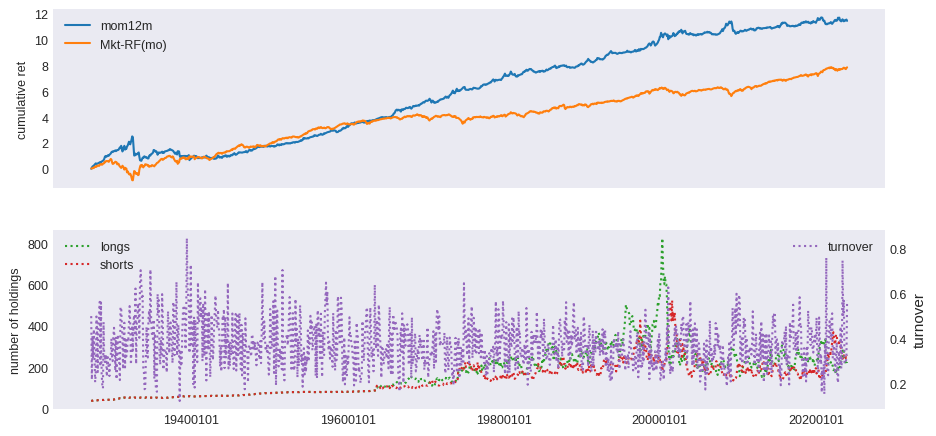

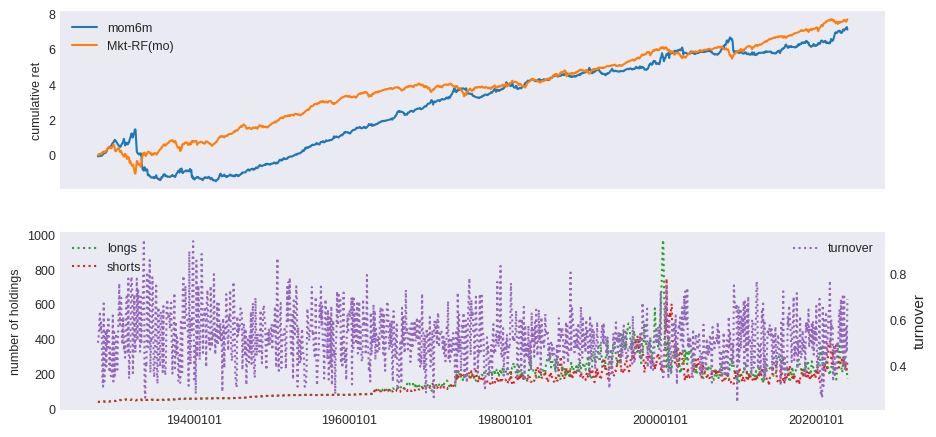

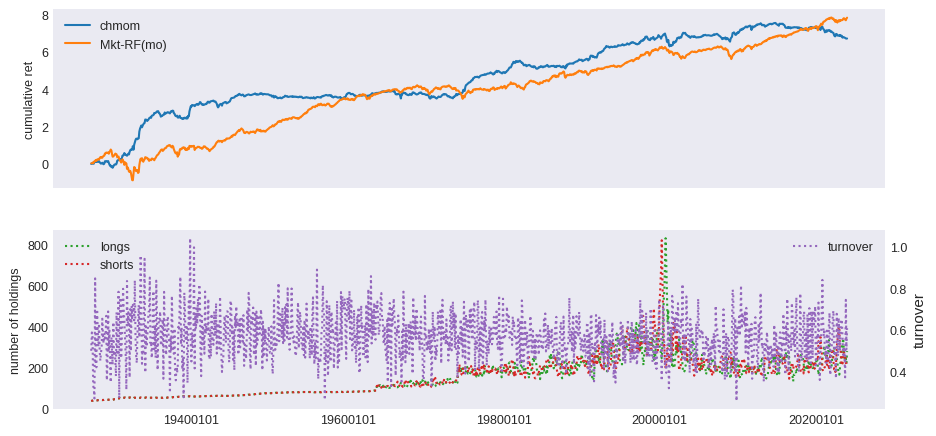

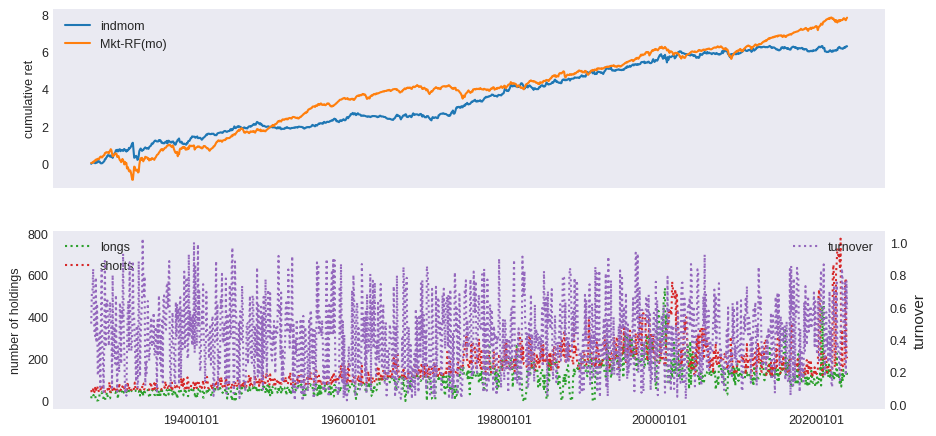

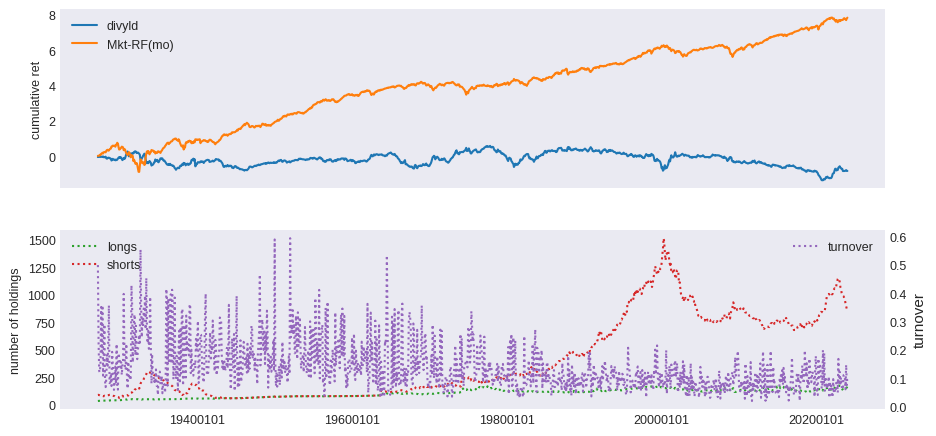

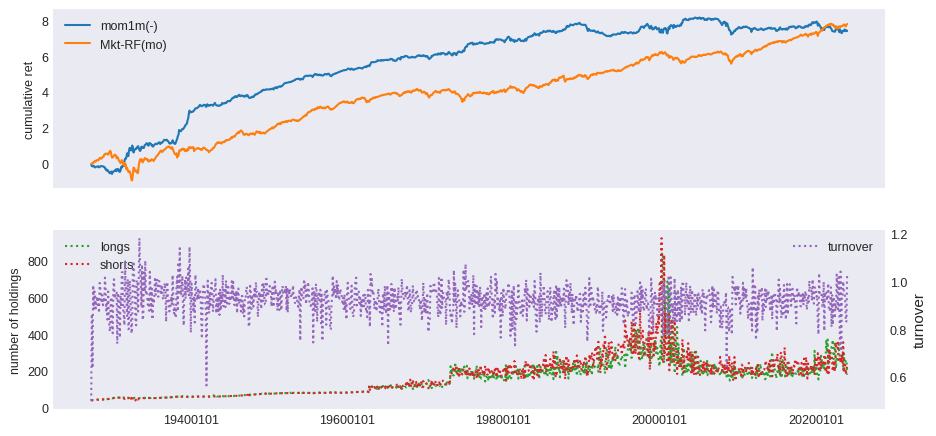

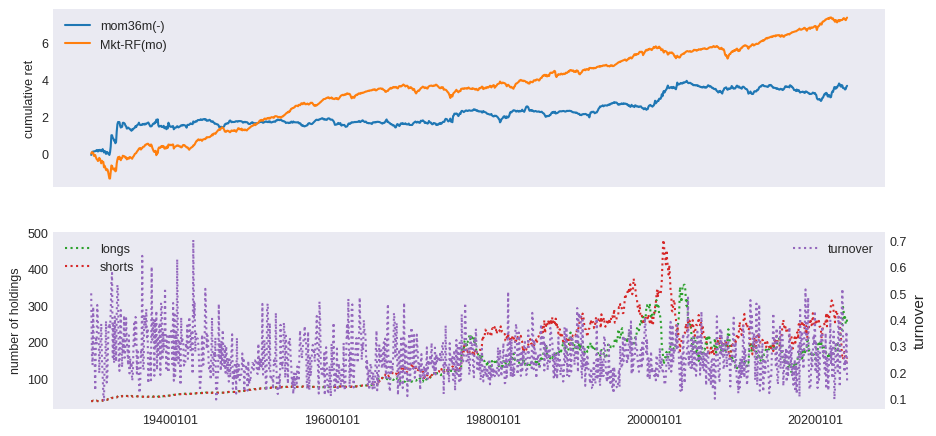

In [125]:
benchnames = ['Mkt-RF(mo)']
rebalbeg, rebalend = 19260101, LAST_DATE
columns = ['mom12m', 'mom6m', 'chmom', 'indmom', 'divyld', 'mom1m', 'mom36m']
for label in tqdm(columns):
    holdings = univariate_sorts(monthly,
                                label,
                                SignalsFrame(signals.read(label)),
                                rebalbeg,
                                rebalend,
                                window=1,
                                months=[],
                                maxdecile=8,
                                minprc=1.0,
                                pct=(10.0, 90.0),
                                leverage=leverage.get(label, 1))
    excess = backtest_pipeline(backtest,
                               monthly,
                               holdings,
                               label,
                               benchnames,
                               overlap=0,
                               outdir=outdir,
                               suffix=(leverage.get(label, 1) < 0)*'(-)')

In [126]:
# helper to calculate beta, idiovol and price delay from weekly returns
def regress(x: np.array, y: np.array) -> Tuple[float, float, float]:
    """helper method to calculate beta, idiovol and price delay

    Args:
      x: equal-weighted market returns (in ascending time order)
      y: stock returns (in ascending time order).  NaN's will be discarded.

    Returns:
      beta: slope from regression on market returns and intercept
      idiovol: mean squared error of residuals
      pricedelay: increase of adjusted Rsq with four market lags over without
    """
    v = np.logical_not(np.isnan(y))
    y = y[v]
    x = x[v]
    n0 = len(y)
    A0 = np.vstack([x, np.ones(len(y))]).T
    b0 = np.linalg.inv(A0.T.dot(A0)).dot(A0.T.dot(y))   # univariate coeffs
    sse0 = np.mean((y - A0.dot(b0))**2)
    sst0 = np.mean((y - np.mean(y))**2)
    if (sst0>0 and sse0>0):
        R0 = (1 - ((sse0 / (n0 - 2)) / (sst0 / (n0 - 1))))
    else:
        R0 = 0
    y4 = y[4:]
    n4 = len(y4)         
    A4 = np.vstack([x[0:-4], x[1:-3], x[2:-2], x[3:-1], x[4:],
                    np.ones(n4)]).T
    b4 = np.linalg.inv(A4.T.dot(A4)).dot(A4.T.dot(y4))  # four lagged coeffs
    sse4 = np.mean((y4 - A4.dot(b4))**2)
    sst4 = np.mean((y4 - np.mean(y4))**2)
    if sst4 > 0 and sse4 > 0:
        R4 = (1 - ((sse4 / (n4 - 6)) / (sst4 / (n4 - 1))))
    else:
        R4 = 0    
    return [b0[0],
            sse0 or np.nan,
            (1 -(R0 / R4)) if R0>0 and R4>0 else np.nan]

Weekly price responses


In [127]:
beg, end = 19260101, LAST_DATE
columns  = ['beta', 'idiovol', 'pricedelay']
wd = BusDay(sql, endweek='Wed')  # custom weekly trading day calendar

Last FamaFrench Date 2024-02-29 00:00:00


In [128]:
width    = 3*52+1           # up to 3 years of weekly returns
minvalid = 52               # at least 52 weeks required to compute beta
weekly   = DataFrame()      # rolling window of weekly stock returns
mkt      = DataFrame()      # to queue equal-weighted market returns
out      = []               # to accumulate final calculations

In [129]:
for date in tqdm(wd.date_range(beg, end, 'weekly')):
    df = crsp.get_ret(wd.begwk(date), date)
    mkt = as_rolling(mkt,       # rolling window of weekly mkt returns
                     DataFrame(data=[df.mean()], columns=[date]),
                     width=width)
    weekly = as_rolling(weekly, # rolling window of weekly stock returns
                        df.rename(date),
                        width=width) 
    valid = weekly.count(axis=1) >= minvalid  # require min number weeks
    if valid.any():
        result = DataFrame([regress(mkt.values[0], y)
                            for y in weekly.loc[valid].values],
                           columns=columns)
        result['permno'] = weekly.index[valid].values
        result['rebaldate'] = date
        if wd.ismonthend(date): # signal value from last week of month
            out.append(result)
out = pd.concat(out, axis=0, ignore_index=True)
for label in columns:
    signals.write(out, label, overwrite=True)

  0%|          | 0/5113 [00:00<?, ?it/s]

100%|██████████| 5113/5113 [33:48<00:00,  2.52it/s]


100%|██████████| 3/3 [16:04<00:00, 321.61s/it]


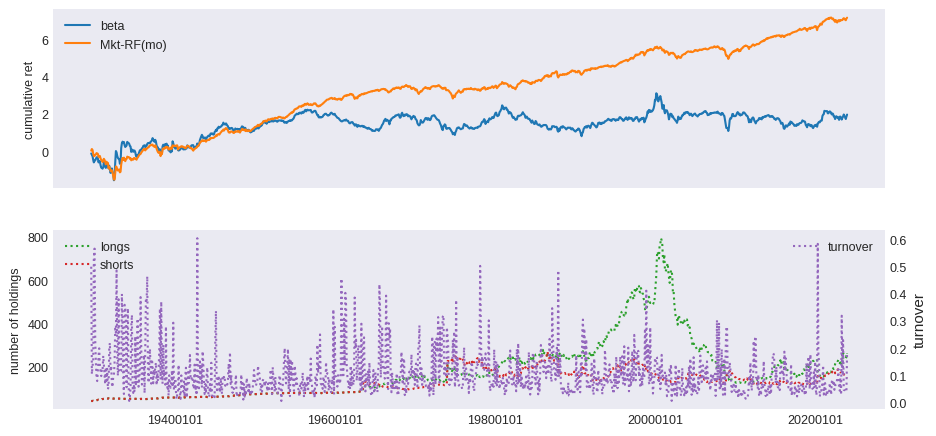

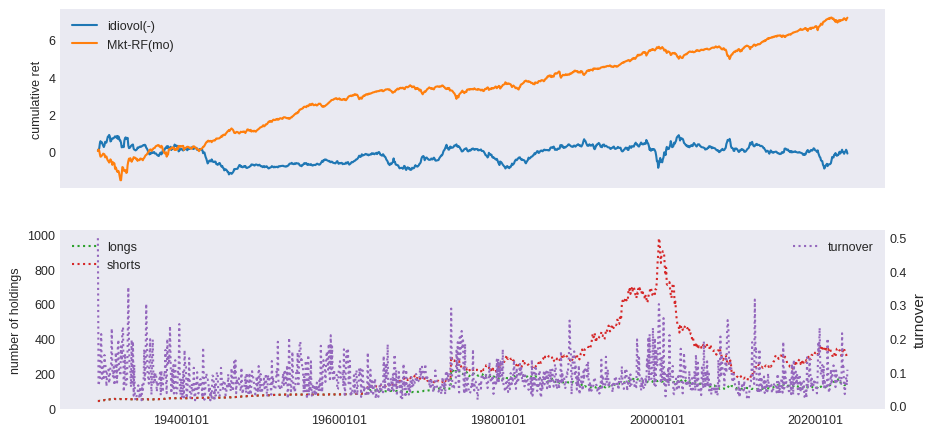

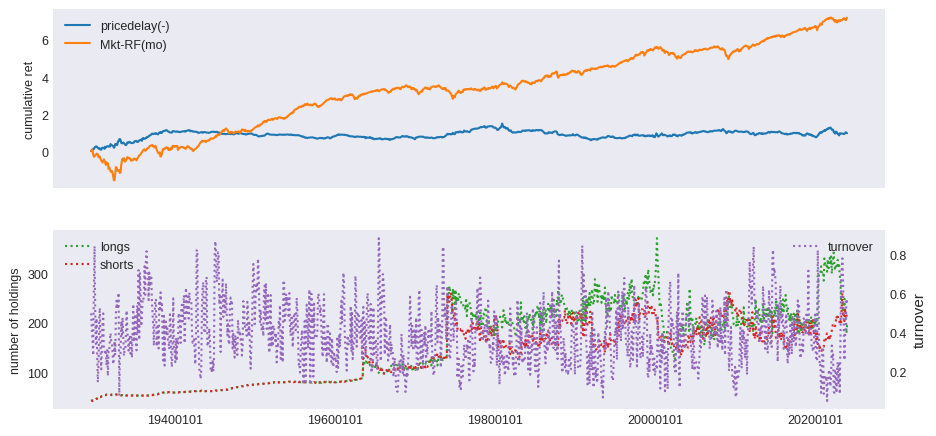

In [130]:
benchnames = ['Mkt-RF(mo)']
rebalbeg, rebalend = 19290601, LAST_DATE
for label in tqdm(columns):
    holdings = univariate_sorts(monthly,
                                label,
                                SignalsFrame(signals.read(label)),
                                rebalbeg,
                                rebalend,
                                window=1,
                                months=[],
                                maxdecile=8,
                                pct=(10., 90.),
                                leverage=leverage.get(label, 1))
    excess = backtest_pipeline(backtest,
                               monthly,
                               holdings,
                               label,
                               benchnames,
                               overlap=0,
                               outdir=outdir,
                               suffix=(leverage.get(label, 1) < 0)*'(-)')

### Liquidity

Liquidity signals from daily stock returns


In [131]:
beg, end = 19830601, LAST_DATE    # nasdaq/volume from after 1982
columns = ['ill', 'maxret', 'retvol', 'baspread', 'std_dolvol',
           'zerotrade', 'std_turn', 'turn']

In [132]:
out = []
dolvol = []
turn = DataFrame()    # to average turn signal over rolling 3-months
dt = bd.date_range(bd.begmo(beg,-3), end, 'endmo') # monthly rebalances
chunksize = 12        # each chunk is 12 months (1 year)
chunks = [dt[i:(i+chunksize)] for i in range(0, len(dt), chunksize)]
for chunk in tqdm(chunks):
    q = (f"SELECT permno, date, ret, askhi, bidlo, prc, vol, shrout "
         f" FROM {crsp['daily'].key}"
         f" WHERE date>={bd.begmo(chunk[0])}"
         f"   AND date<={chunk[-1]}")        # retrieve a chunk
    f = crsp.sql.read_dataframe(q).sort_values(['permno', 'date'])
    f['baspread'] = ((f['askhi'] - f['bidlo']) / ((f['askhi'] + f['bidlo']) / 2))
    f['dolvol'] = f['prc'].abs() * f['vol']
    f['turn1'] = f['vol'] / f['shrout']
    f.loc[f['dolvol']>0, 'ldv'] = np.log(f.loc[f['dolvol']>0, 'dolvol'])
    f['ill'] = 1000000 * f['ret'].abs() / f['dolvol']

    for rebaldate in chunk:            # for each rebaldate in the chunk
        grouped = f[f['date'].ge(bd.begmo(rebaldate))
                    & f['date'].le(rebaldate)].groupby('permno')
        df = grouped[['ret']].max().rename(columns={'ret': 'maxret'})
        df['retvol'] = grouped['ret'].std()
        df['baspread'] = grouped['baspread'].mean()
        df['std_dolvol'] = grouped['ldv'].std()
        df['ill'] = grouped['ill'].mean()
        dv = grouped['dolvol'].sum()
        df.loc[dv > 0, 'dolvol'] = np.log(dv[dv > 0])
        df['turn1'] = grouped['turn1'].sum()
        df['std_turn'] = grouped['turn1'].std()
        df['countzero'] = grouped['vol'].apply(lambda v: sum(v==0))
        df['ndays'] = grouped['prc'].count()
            
        turn = as_rolling(turn, df[['turn1']], width=3)
        df['turn'] = turn.reindex(df.index).mean(axis=1, skipna=False)
        df.loc[df['turn1'].le(0), 'turn1'] = 0
        df.loc[df['ndays'].le(0), 'ndays'] = 0
        df['zerotrade'] = ((df['countzero'] + ((1/df['turn1'])/480000))
                           * 21/df['ndays'])
    
        df['rebaldate'] = rebaldate
        df = df.reset_index()
        out.append(df[['permno', 'rebaldate'] + columns])
        if rebaldate < bd.endmo(end):
            df['rebaldate'] = bd.endmo(rebaldate, 1)
            dolvol.append(df[['permno','rebaldate','dolvol']])
out = pd.concat(out, axis=0, ignore_index=True)
dolvol = pd.concat(dolvol, axis=0, ignore_index=True)            

  0%|          | 0/41 [00:00<?, ?it/s]

100%|██████████| 41/41 [26:09<00:00, 38.28s/it]


In [133]:
for label in columns:
    n = signals.write(out, label, overwrite=True)
n = signals.write(dolvol, 'dolvol', overwrite=True)

100%|██████████| 9/9 [59:11<00:00, 394.66s/it]


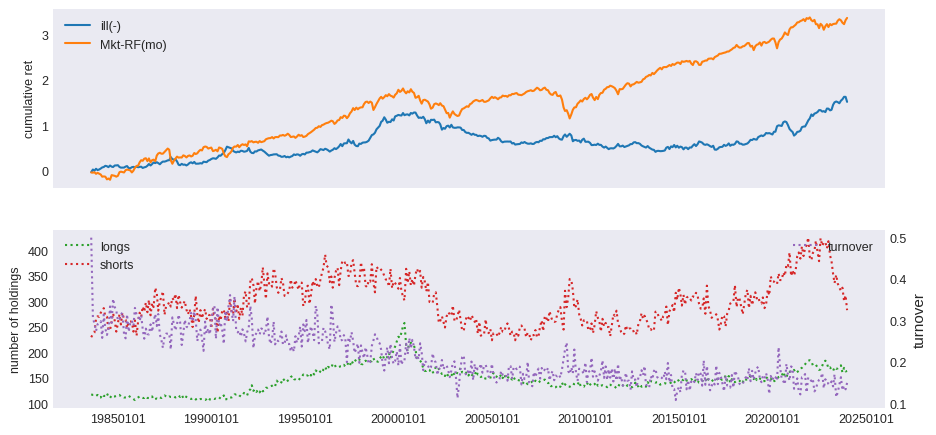

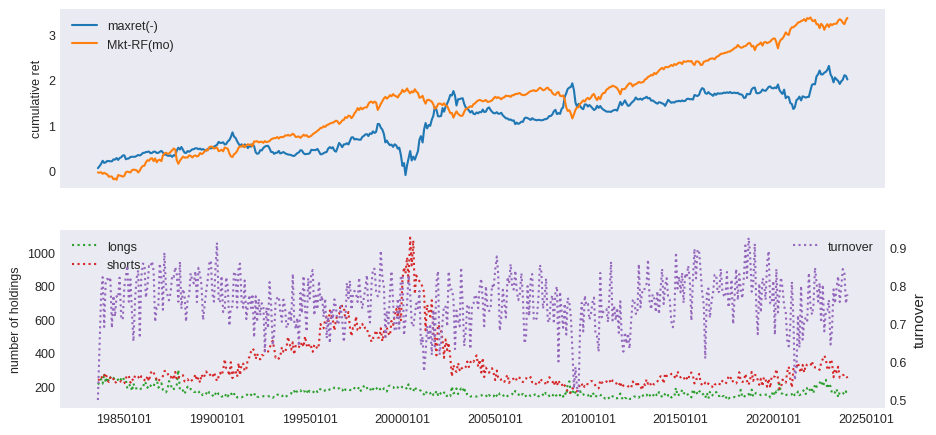

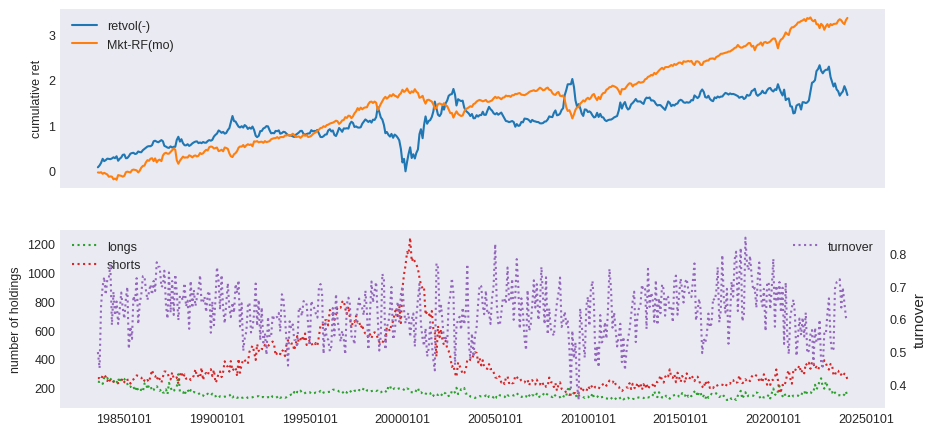

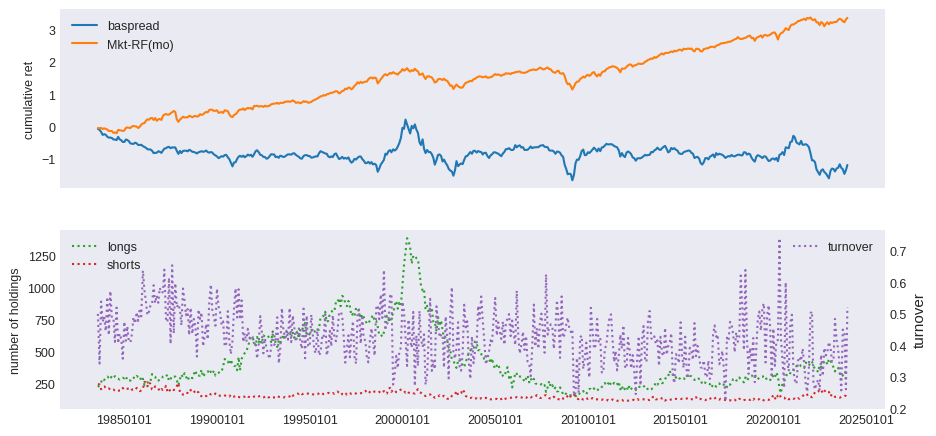

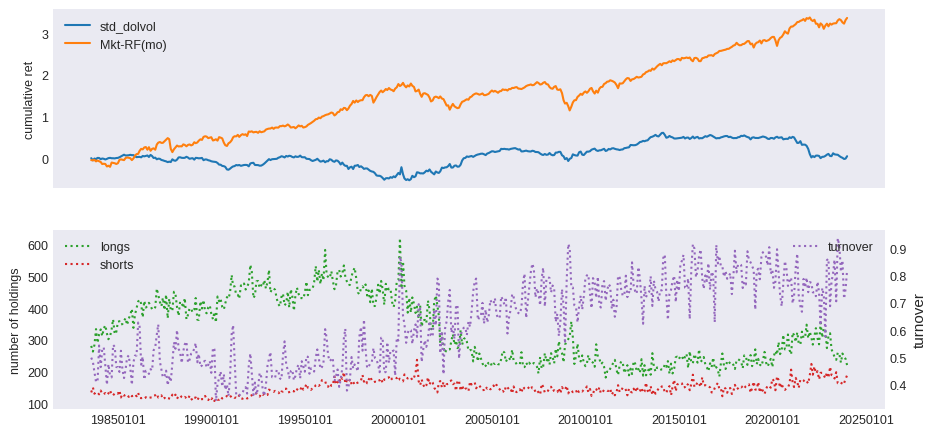

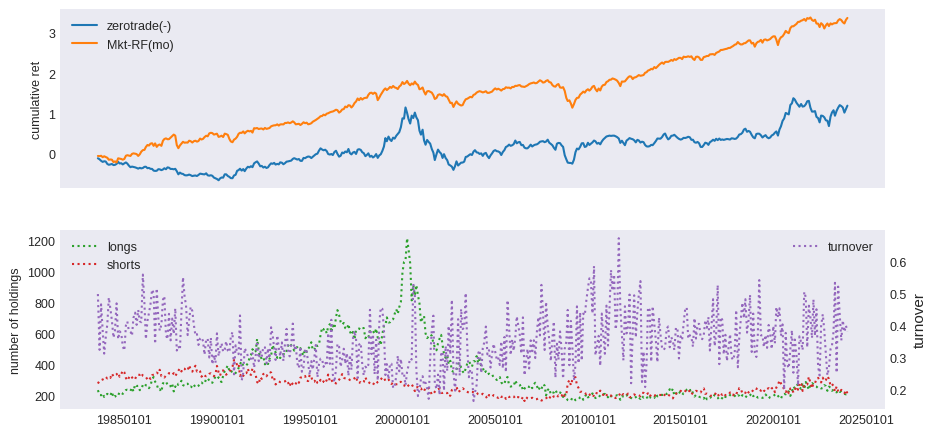

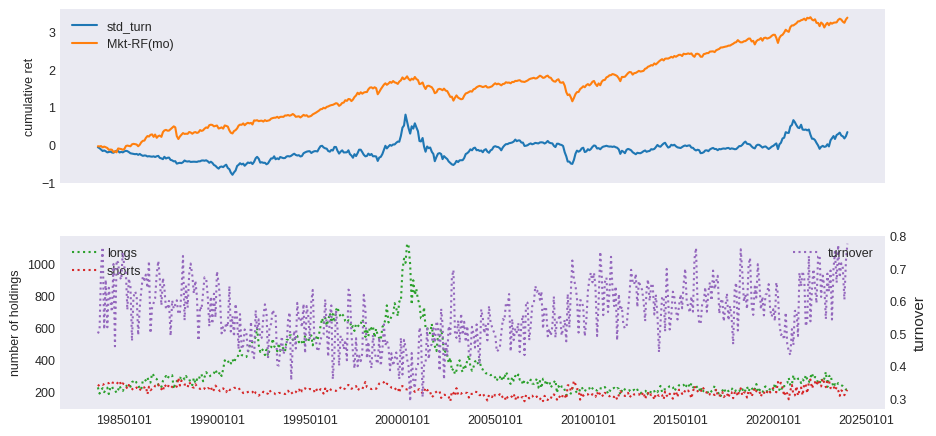

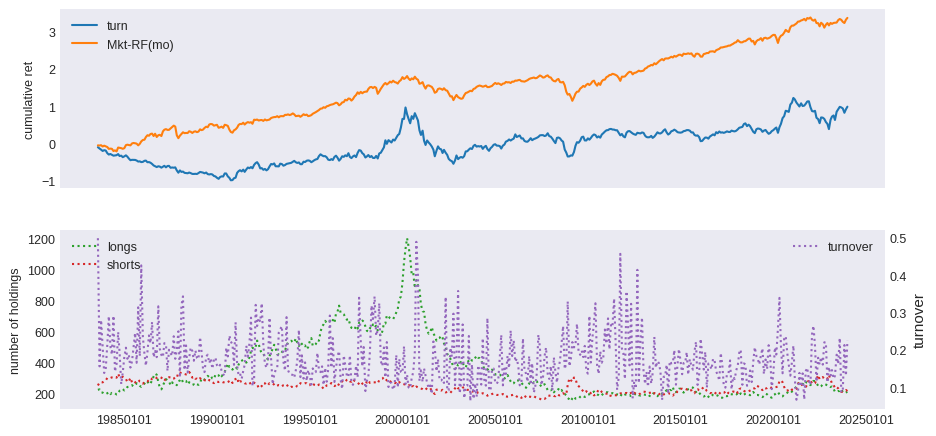

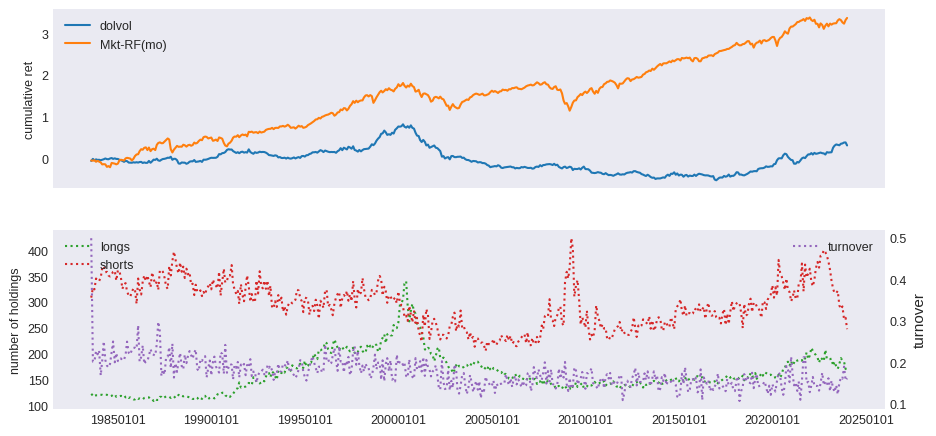

In [134]:
rebalbeg, rebalend = 19830601, LAST_DATE
benchnames = ['Mkt-RF(mo)']
for label in tqdm(columns + ['dolvol']):
    holdings = univariate_sorts(monthly,
                                label,
                                SignalsFrame(signals.read(label)),
                                rebalbeg,
                                rebalend,
                                window=1,
                                months=[],
                                maxdecile=8,
                                pct=(10., 90.),
                                leverage=leverage.get(label, 1))
    excess = backtest_pipeline(backtest,
                               monthly,
                               holdings,
                               label,
                               benchnames,
                               overlap=0,
                               outdir=outdir,
                               suffix=(leverage.get(label, 1) < 0)*'(-)')

### Fundamentals

Fundamental signals from Compustat Annual


In [135]:
columns = ['absacc', 'acc', 'agr', 'bm', 'cashpr', 'cfp', 'chcsho',
           'chinv', 'depr', 'dy', 'egr', 'ep', 'gma', 'grcapx',
           'grltnoa', 'hire', 'invest', 'lev', 'lgr' ,
           'pchdepr', 'pchgm_pchsale', 'pchquick',
           'pchsale_pchinvt', 'pchsale_pchrect', 'pchsale_pchxsga',
           'pchsaleinv', 'pctacc', 'quick', 'rd_sale', 'rd_mve',
           'realestate', 'salecash', 'salerec', 'saleinv', 'secured',
           'sgr', 'sp', 'tang', 'bm_ia', 'cfp_ia', 'chatoia' , 'chpmia',
           'pchcapx_ia', 'chempia', 'mve_ia']
numlag = 6       # number of months to lag data for rebalance
end = LAST_DATE   # last data date

In [136]:
# retrieve annual, keep [permno, datadate] with non null prccq if any
fields = ['sic', 'fyear', 'ib', 'oancf', 'at', 'act', 'che', 'lct',
          'dlc', 'dltt', 'prcc_f', 'csho', 'invt', 'dp', 'ppent',
          'dvt', 'ceq', 'txp', 'revt', 'cogs', 'rect', 'aco', 'intan',
          'ao', 'ap', 'lco', 'lo', 'capx', 'emp', 'ppegt', 'lt',
          'sale', 'xsga', 'xrd', 'fatb', 'fatl', 'dm']
df = pstat.get_linked(dataset='annual',
                      fields=fields,
                      date_field='datadate',
                      where=(f"indfmt = 'INDL' "
                             f"  AND datafmt = 'STD'"
                             f"  AND curcd = 'USD' "
                             f"  AND popsrc = 'D'"
                             f"  AND consol = 'C'"
                             f"  AND datadate <= {end//100}31"))
fund = df.sort_values(['permno', 'datadate', 'ib'])\
         .drop_duplicates(['permno', 'datadate'])\
         .dropna(subset=['ib'])
fund.index = list(zip(fund['permno'], fund['datadate']))  # multi-index
fund['rebaldate'] = bd.endmo(fund.datadate, numlag)

In [137]:
# precompute, and lag common metrics: mve_f avg_at sic2
fund['sic2'] = np.where(fund['sic'].notna(), fund['sic'] // 100, 0)
fund['fyear'] = fund['datadate'] // 10000      # can delete this
fund['mve_f'] = fund['prcc_f'] * fund['csho']

In [138]:
lag = fund.shift(1, fill_value=0)
lag.loc[lag['permno'] != fund['permno'], fields] = np.nan
fund['avg_at'] = (fund['at'] + lag['at']) / 2

In [139]:
lag2 = fund.shift(2, fill_value=0)
lag2.loc[lag2['permno'] != fund['permno'], fields] = np.nan
lag['avg_at'] = (lag['at'] + lag2['at']) / 2

In [140]:
fund['bm'] = fund['ceq'] / fund['mve_f']
fund['cashpr'] = (fund['mve_f'] + fund['dltt'] - fund['at'])/fund['che']
fund['depr'] = fund['dp'] / fund['ppent']
fund['dy'] = fund['dvt'] / fund['mve_f']
fund['ep'] = fund['ib'] / fund['mve_f']
fund['lev'] = fund['lt'] / fund['mve_f']
fund['quick'] = (fund['act'] - fund['invt']) / fund['lct']
fund['rd_sale'] = fund['xrd'] / fund['sale']
fund['rd_mve'] = fund['xrd'] / fund['mve_f']
fund['realestate'] = ((fund['fatb'] + fund['fatl']) /
                      np.where(fund['ppegt'].notna(),
                               fund['ppegt'], fund['ppent']))
fund['salecash'] = fund['sale'] / fund['che']
fund['salerec'] = fund['sale'] / fund['rect']
fund['saleinv'] = fund['sale'] / fund['invt']
fund['secured'] = fund['dm'] / fund['dltt']
fund['sp'] = fund['sale'] / fund['mve_f']
fund['tang'] = (fund['che'] + fund['rect'] * 0.715 + fund['invt'] * 0.547
                + fund['ppent'] * 0.535) / fund['at']

In [141]:
# changes: agr chcsho chinv egr gma egr grcapx grltnoa emp invest lgr
fund['agr'] = (fund['at'] / lag['at'])
fund['chcsho'] = (fund['csho'] / lag['csho'])
fund['chinv'] = ((fund['invt'] - lag['invt']) / fund['avg_at'])
fund['egr'] = (fund['ceq'] / lag['ceq'])
fund['gma'] = ((fund['revt'] - fund['cogs']) / lag['at'])
fund['grcapx'] = (fund['capx'] / lag2['capx'])
fund['grltnoa'] =  (((fund['rect']
                      + fund['invt']
                      + fund['ppent']
                      + fund['aco']
                      + fund['intan']
                      + fund['ao']
                      - fund['ap']
                      - fund['lco']
                      - fund['lo'])
                     / (lag['rect']
                        + lag['invt']
                        + lag['ppent']
                        + lag['aco']
                        + lag['intan']
                        + lag['ao']
                        - lag['ap']
                        - lag['lco']
                        - lag['lo']))
                    - ((fund['rect']
                        + fund['invt']
                        + fund['aco']
                        - fund['ap']
                        - fund['lco'])
                       - (lag['rect']
                          + lag['invt']
                          + lag['aco']
                          - lag['ap']
                          - lag['lco']))) / fund['avg_at']
fund['hire'] = ((fund['emp'] / lag['emp']) - 1).fillna(0)
fund['invest'] = (((fund['ppegt'] - lag['ppegt'])
                   + (fund['invt'] - lag['invt'])) / lag['at'])
fund['invest'] = fund['invest'].where(fund['invest'].notna(),
                                      ((fund['ppent'] - lag['ppent'])
                                       + (fund['invt'] - lag['invt'])) / lag['at'])
fund['lgr'] = (fund['lt'] / lag['lt'])
fund['pchdepr'] = ((fund['dp'] / fund['ppent']) / (lag['dp'] / lag['ppent']))
fund['pchgm_pchsale'] = (((fund['sale'] - fund['cogs']) / (lag['sale'] - lag['cogs']))
                         - (fund['sale'] / lag['sale']))
fund['pchquick'] = (((fund['act'] - fund['invt']) / fund['lct'])
                    / ((lag['act'] - lag['invt']) / lag['lct']))
fund['pchsale_pchinvt'] = ((fund['sale'] / lag['sale']) - (fund['invt'] / lag['invt']))
fund['pchsale_pchrect'] = ((fund['sale'] / lag['sale']) - (fund['rect'] / lag['rect']))
fund['pchsale_pchxsga'] = ((fund['sale'] / lag['sale']) - (fund['xsga'] / lag['xsga']))
fund['pchsaleinv'] = ((fund['sale'] / fund['invt']) / (lag['sale'] / lag['invt']))
fund['sgr'] = (fund['sale'] / lag['sale'])

In [142]:
fund['chato'] = ((fund['sale'] / fund['avg_at']) - (lag['sale'] / lag['avg_at']))
fund['chpm'] = (fund['ib'] / fund['sale']) - (lag['ib'] / lag['sale'])
fund['pchcapx'] = fund['capx'] / lag['capx']

In [143]:
# compute signals with alternative definitions: acc absacc cfp
fund['_acc'] = (((fund['act'] - lag['act']) - (fund['che'] - lag['che']))
                - ((fund['lct'] - lag['lct']) - (fund['dlc'] - lag['dlc'])
                   - (fund['txp'] - lag['txp']) - fund['dp']))
fund['cfp'] = ((fund['ib'] - (((fund['act'] - lag['act']) - (fund['che'] - lag['che']))
                              - ((fund['lct'] - lag['lct'])
                                 - (fund['dlc'] - lag['dlc'])
                                 - (fund['txp'] - lag['txp'])
                                 - fund['dp']))) / fund['mve_f'])
g = fund['oancf'].notnull()
fund.loc[g, 'cfp'] = fund.loc[g, 'oancf'] / fund.loc[g, 'mve_f']
fund.loc[g, '_acc'] = fund.loc[g, 'ib'] - fund.loc[g, 'oancf']
fund['acc'] = fund['_acc'] / fund['avg_at']
fund['absacc'] = abs(fund['_acc']) / fund['avg_at']
fund['pctacc'] = fund['_acc'] / abs(fund['ib'])
h = (fund['ib'].abs() <= 0.01)
fund.loc[h, 'pctacc'] = fund.loc[h, '_acc'] / 0.01

In [144]:
# industry-adjusted
cols = {'bm_ia': 'bm', 'cfp_ia': 'cfp', 'chatoia': 'chato',
        'chpmia': 'chpm', 'pchcapx_ia': 'pchcapx',
        'chempia': 'hire', 'mve_ia': 'mve_f'}
group = fund.groupby(['sic2', 'fyear'])
for k,v in cols.items():
    fund[k] = fund[v] - group[v].transform('mean')

In [145]:
for label in columns:
    signals.write(fund, label, overwrite=True)

 44%|████▍     | 20/45 [21:57<27:24, 65.77s/it]/home/terence/Dropbox/github/data-science-notebooks/finds/backtesting/backtest.py:310: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, (ax1, ax2) = plt.subplots(2, 1, sharex=True, clear=True,
100%|██████████| 45/45 [48:40<00:00, 64.89s/it]


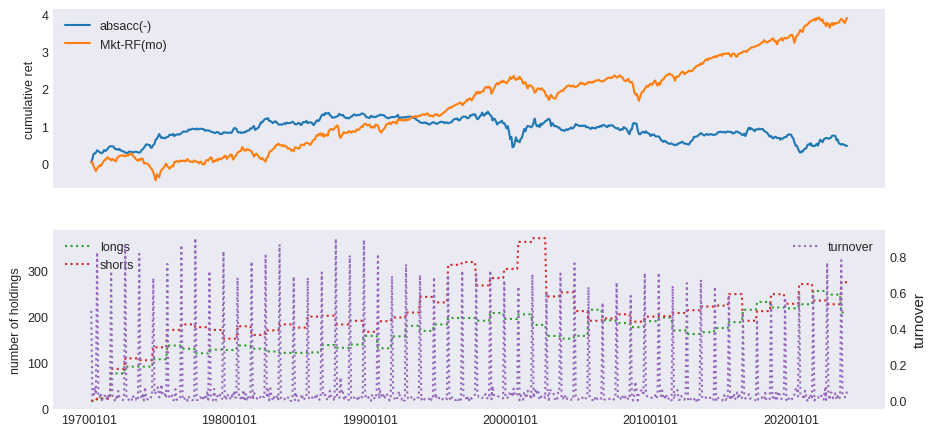

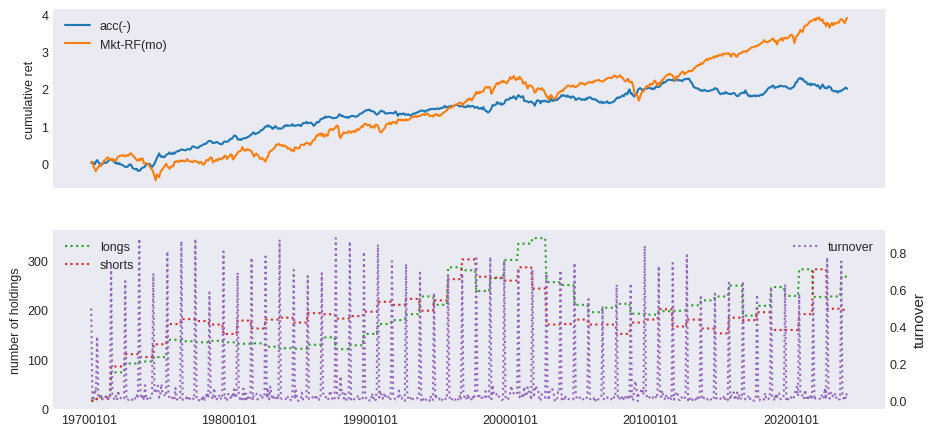

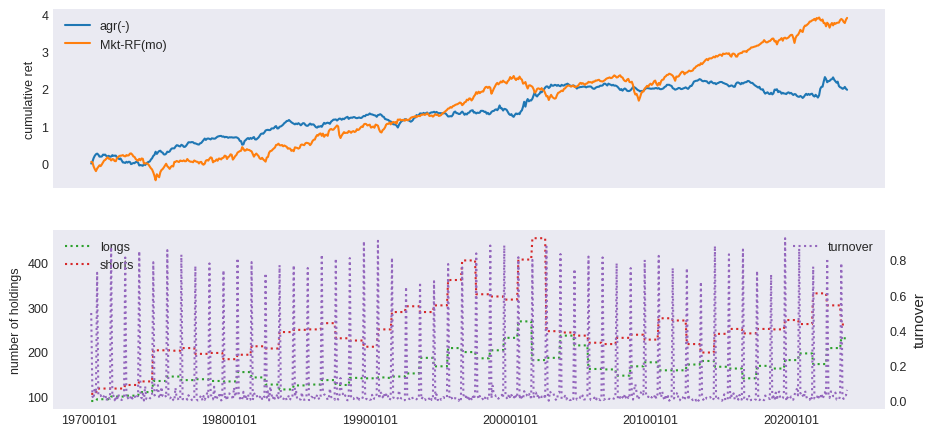

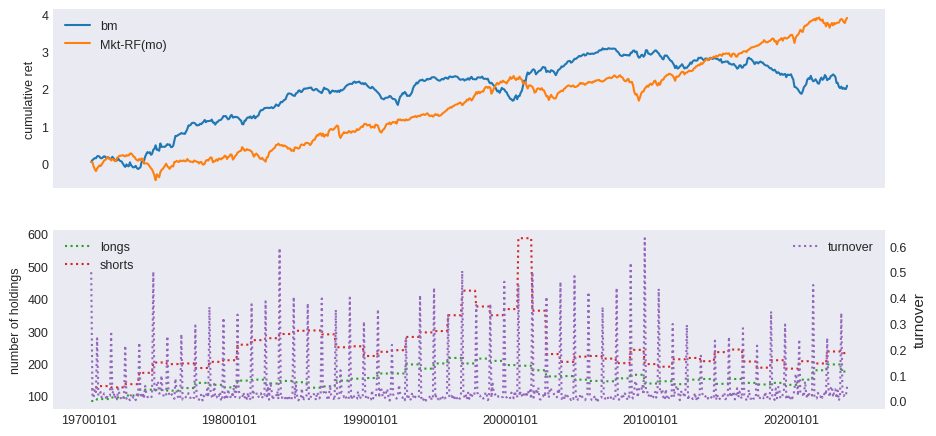

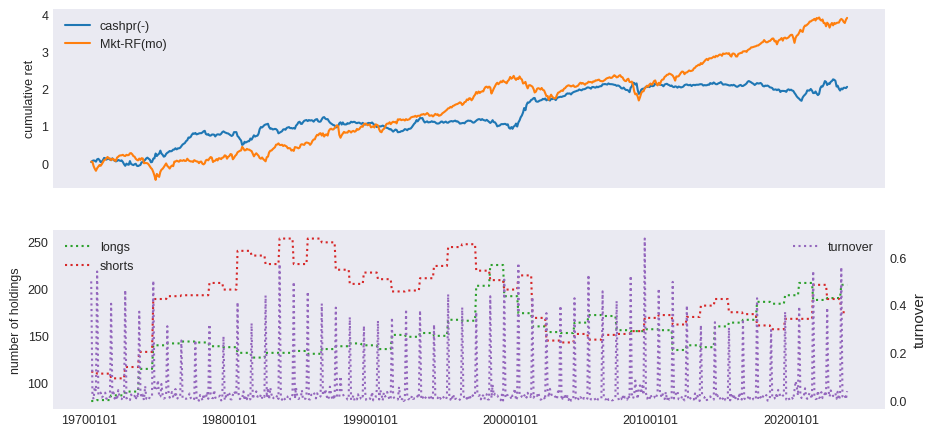

...

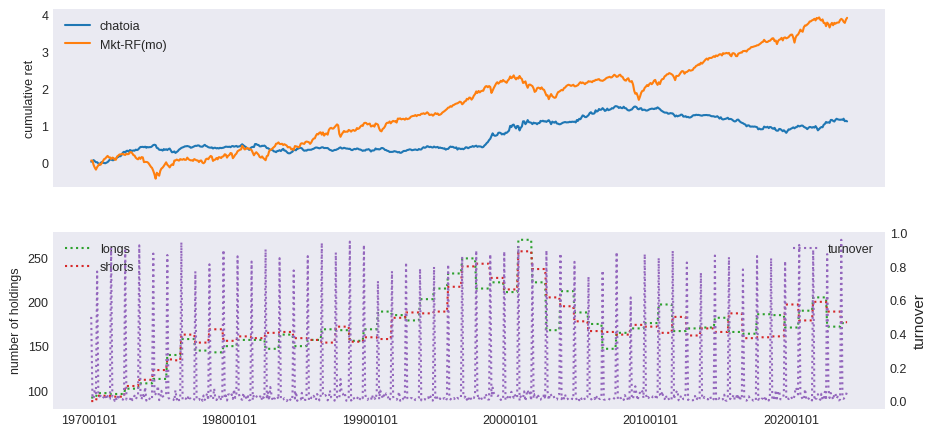

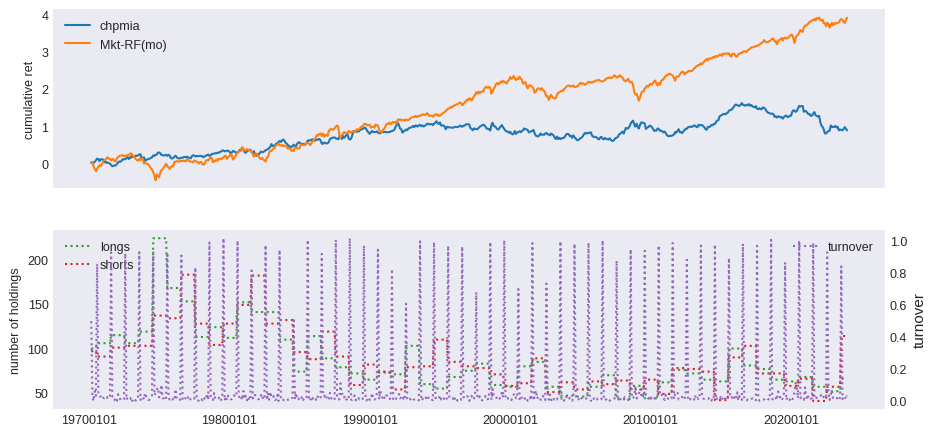

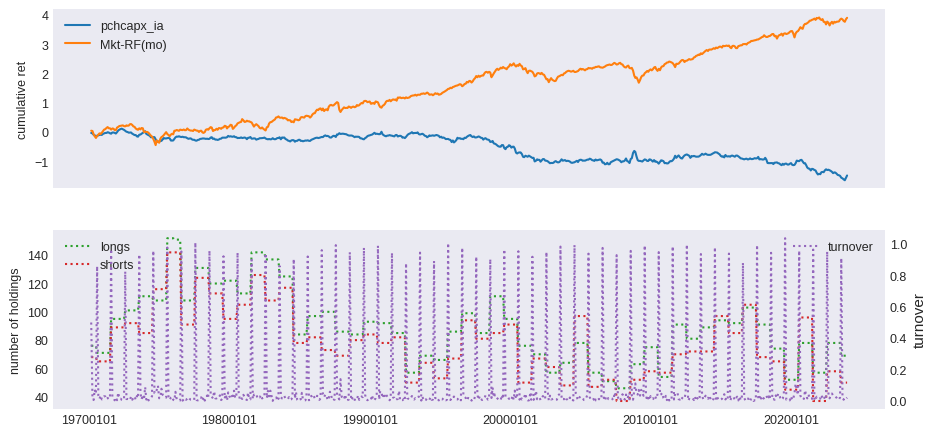

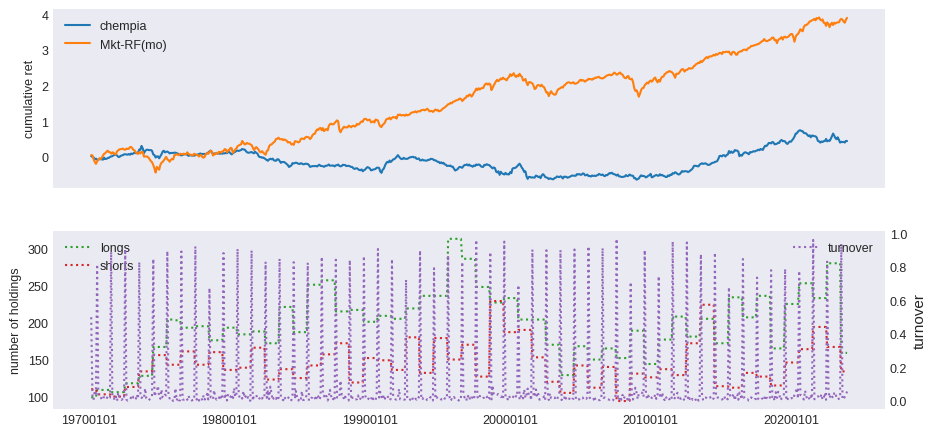

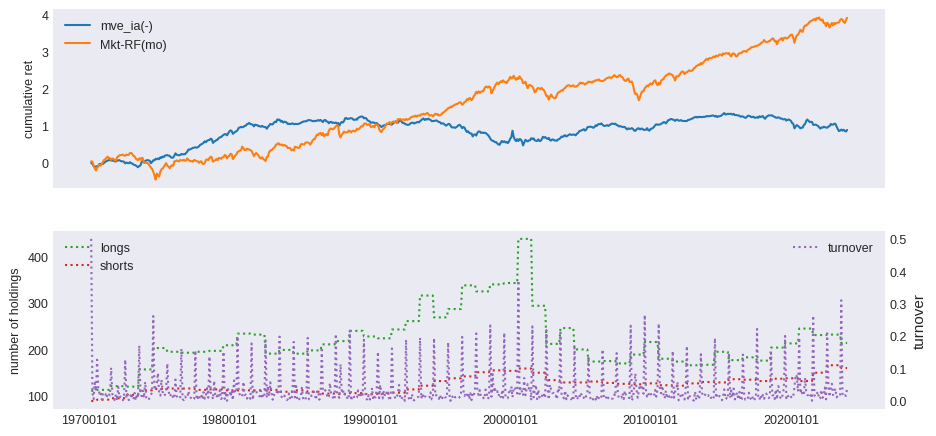

In [146]:
rebalbeg, rebalend = 19700101, LAST_DATE
benchnames = ['Mkt-RF(mo)'] #['Mom']  #['ST_Rev(mo)']   #
for label in tqdm(columns):
    holdings = univariate_sorts(monthly,
                                label,
                                SignalsFrame(signals.read(label)),
                                rebalbeg,
                                rebalend,
                                window=12,
                                months=[6],
                                maxdecile=8,
                                pct=(10., 90.),
                                leverage=leverage.get(label, 1))
    excess = backtest_pipeline(backtest,
                               monthly,
                               holdings,
                               label,
                               benchnames,
                               overlap=0,
                               outdir=outdir,
                               suffix=(leverage.get(label, 1) < 0)*'(-)')

Fundamental signals from Compustat Quarterly


In [147]:
columns = ['stdacc', 'stdcf', 'roavol', 'sgrvol', 'cinvest', 'chtx',
           'rsup', 'roaq', 'cash', 'nincr']
numlag = 4       # require 4 month lag of fiscal data
end = LAST_DATE

In [148]:
# retrieve quarterly, keep [permno, datadate] key with non null prccq
fields = ['ibq', 'actq', 'cheq', 'lctq', 'dlcq', 'saleq', 'prccq',
          'cshoq', 'atq', 'txtq', 'ppentq']
df = pstat.get_linked(dataset='quarterly',
                      fields=fields,
                      date_field='datadate',
                      where=(f"datadate > 0 "
                             f"and datadate <= {end//100}31"))
fund = df.sort_values(['permno','datadate', 'ibq'])\
         .drop_duplicates(['permno', 'datadate'])\
         .dropna(subset=['ibq'])
fund.index = list(zip(fund['permno'], fund['datadate']))
rebaldate = bd.endmo(fund.datadate, numlag)

In [149]:
# compute current and lagged: scf sacc roaq nincr cinvest cash rsup chtx
lag = fund.shift(1, fill_value=0)
lag.loc[lag['permno'] != fund['permno'], fields] = np.nan
fund['_saleq'] = fund['saleq']
fund.loc[fund['_saleq'].lt(0.01), '_saleq'] = 0.01

In [150]:
fund['sacc'] = (((fund['actq'] - lag['actq']) - (fund['cheq'] - lag['cheq']))
                - ((fund['lctq'] - lag['lctq'])
                   - (fund['dlcq'] - lag['dlcq']))) / fund['_saleq']
fund['cinvest'] = (fund['ppentq'] - lag['ppentq']) / fund['_saleq']
fund['nincr'] = (fund['ibq'] > lag['ibq']).astype(int)
fund['scf']  = (fund['ibq'] / fund['_saleq']) - fund['sacc']
fund['roaq'] = (fund['ibq'] / lag['atq'])
fund['cash'] = (fund['cheq'] / fund['atq'])

In [151]:
lag4 = fund.shift(4, fill_value=0)
lag4.loc[lag4['permno'] != fund['permno'], fields] = np.nan
fund['rsup'] = ((fund['saleq'] - lag4['saleq'])
                / (fund['prccq'].abs() * fund['cshoq'].abs()))
fund['chtx'] = (fund['txtq'] - lag4['txtq']) / lag4['atq']

In [ ]:
# for each var: make dataframe of 15 lags (column names=[0,...,15])
lags = {col : as_lags(fund, var=col, key='permno', nlags=16)
        for col in ['sacc', 'scf', 'roaq', 'rsup', 'cinvest', 'nincr']}
for i in range(1, 16):                      # lags[ninrc][i]=1 iff ibq
    lags['nincr'][i] *= lags['nincr'][i-1]  # increasing all prior qtrs

    # compute signals from the 15 lags
    fund['rebaldate'] = rebaldate
    fund['stdacc'] = lags['sacc'].std(axis=1, skipna=False)
    fund['stdcf'] = lags['scf'].std(axis=1, skipna=False)
    fund['roavol'] = lags['roaq'].std(axis=1, skipna=False)
    fund['sgrvol'] = lags['rsup'].std(axis=1, skipna=False)
    fund['cinvest'] = (fund['cinvest'] -
                       lags['cinvest'][[1, 2, 3, 4]].mean(axis=1, skipna=False))
    
    # count number of consecutive increasing quarters
    fund['nincr'] = lags['nincr'][np.arange(8)].sum(axis=1)

In [153]:
for label in columns:
    signals.write(fund, label, overwrite=True)

100%|██████████| 10/10 [08:33<00:00, 51.36s/it]


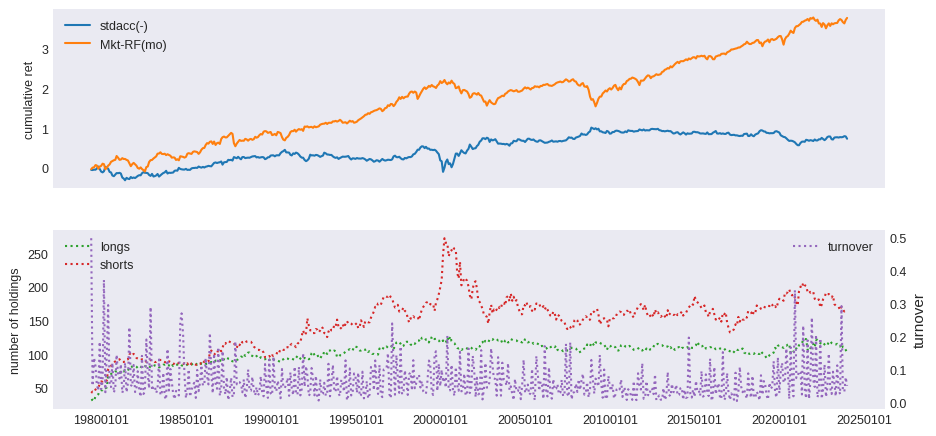

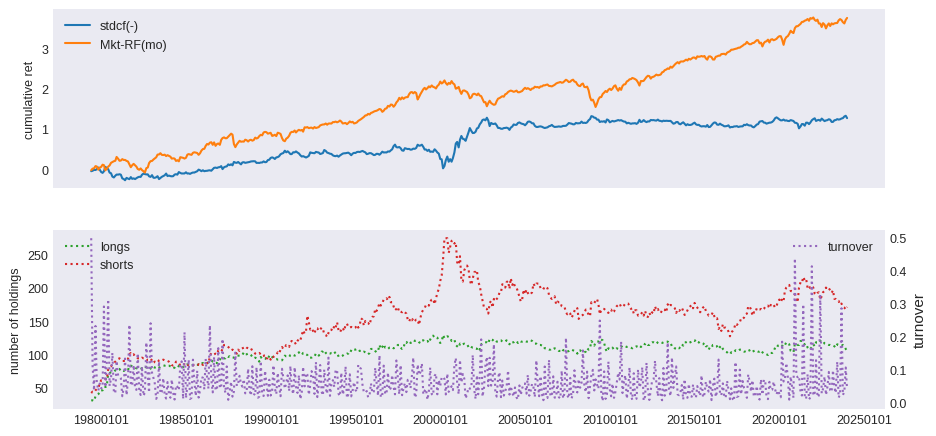

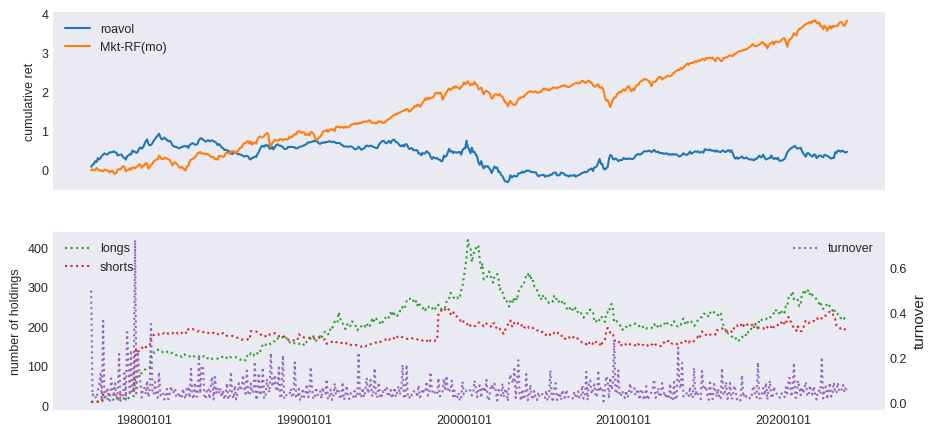

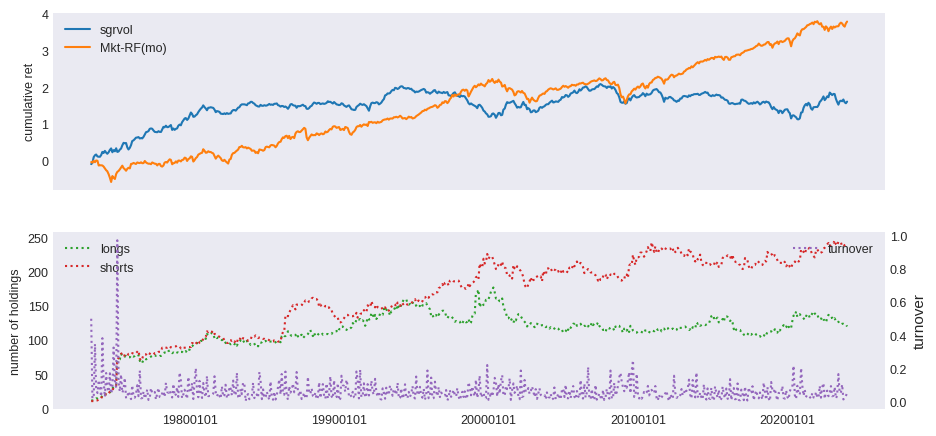

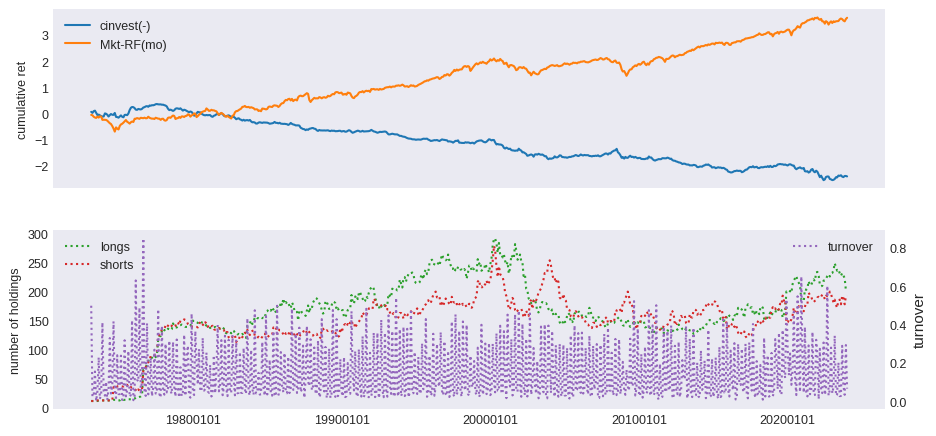

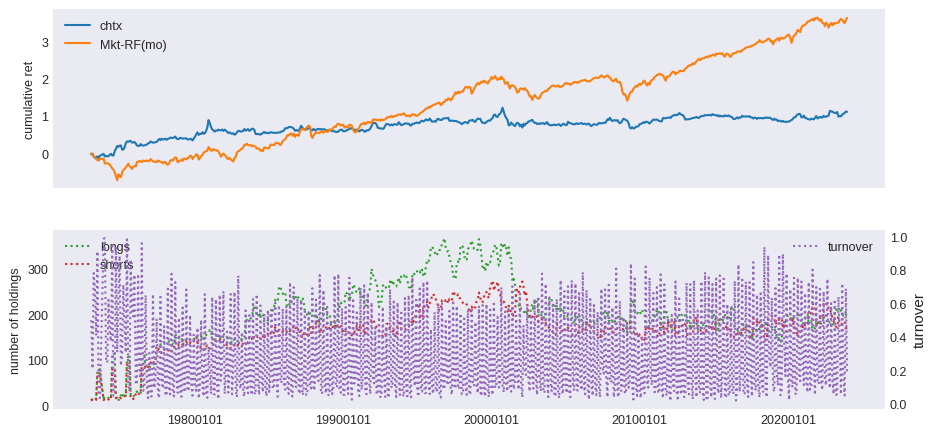

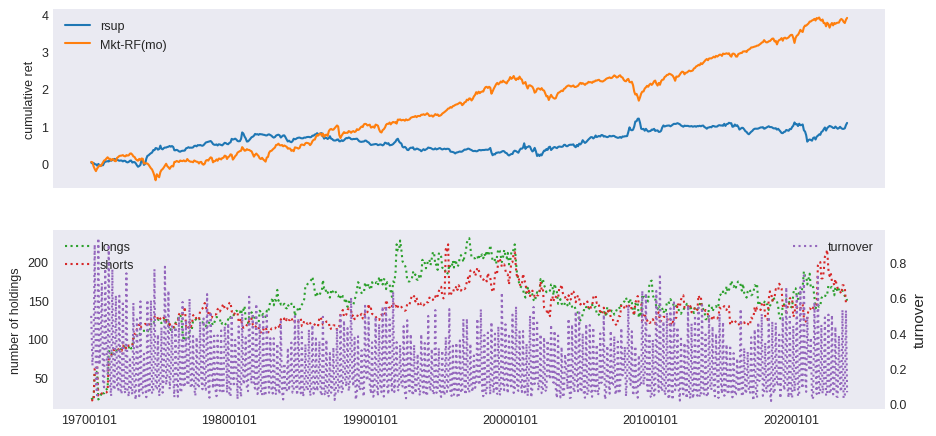

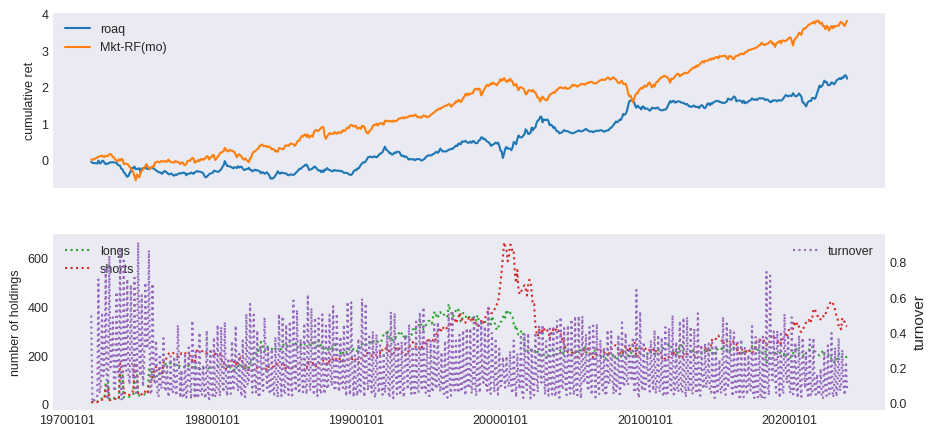

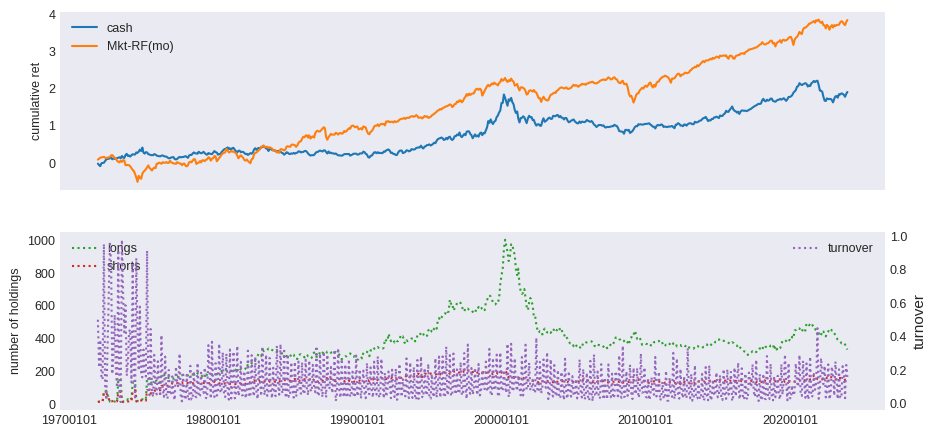

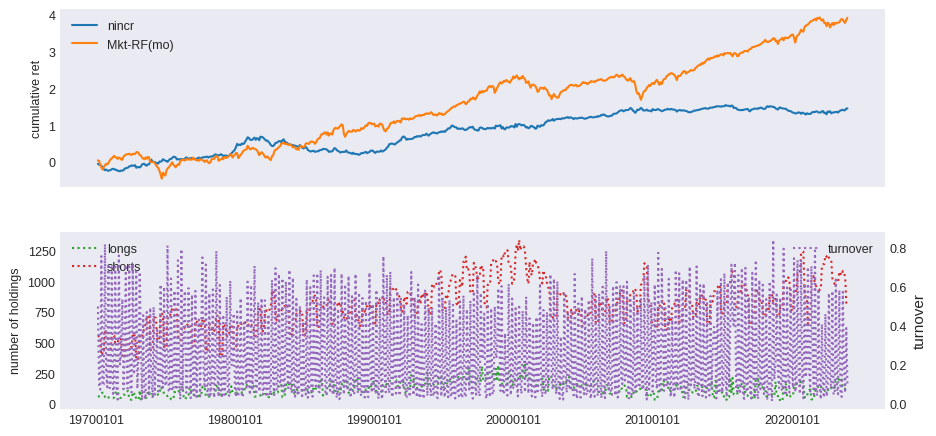

In [154]:
rebalbeg, rebalend = 19700101, LAST_DATE
benchnames = ['Mkt-RF(mo)']
for label in tqdm(columns):
    holdings = univariate_sorts(monthly,
                                label,
                                SignalsFrame(signals.read(label)),
                                rebalbeg,
                                rebalend,
                                window=3,
                                months=[],
                                maxdecile=8,
                                pct=(10., 90.),
                                leverage=leverage.get(label, 1))
    excess = backtest_pipeline(backtest,
                               monthly,
                               holdings,
                               label,
                               benchnames,
                               overlap=0,
                               outdir=outdir,
                               suffix='(-)'*(leverage.get(label, 1) < 0))

### Earnings Estimates

IBES Fiscal Year 1 signals


In [155]:
columns = ['chfeps', 'chnanalyst', 'disp']

In [156]:
df = ibes.get_linked(dataset='statsum',
                     fields=['fpedats', 'meanest', 'medest',
                             'stdev', 'numest'],
                     date_field = 'statpers',
                     where=("meanest IS NOT NULL "
                            "  AND fpedats IS NOT NULL "
                            "  AND statpers IS NOT NULL"
                            "  AND fpi = '1'"))
out = df.sort_values(['permno', 'statpers', 'fpedats', 'meanest'])\
        .drop_duplicates(['permno', 'statpers', 'fpedats'])
out['rebaldate'] = bd.endmo(out['statpers'])

In [157]:
out['disp'] = out['stdev'] / abs(out['meanest'])
out.loc[abs(out['meanest']) < 0, 'disp'] = out['stdev'] / 0.01

In [158]:
lag1 = out.shift(1, fill_value=0)
f1 = (lag1['permno'] == out['permno'])        
out.loc[f1, 'chfeps'] = out.loc[f1, 'meanest'] - lag1.loc[f1, 'meanest']

In [159]:
lag3 = out.shift(3, fill_value=0)
f3 = (lag3['permno'] == out['permno'])
out.loc[f3, 'chnanalyst'] = out.loc[f3, 'numest']-lag3.loc[f3, 'numest']

In [160]:
for label in columns:
    signals.write(out, label, overwrite=True)

100%|██████████| 3/3 [02:45<00:00, 55.09s/it]


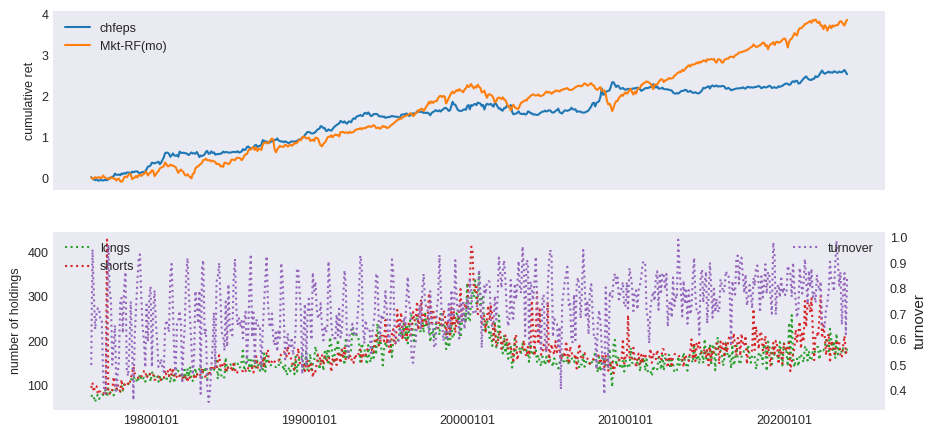

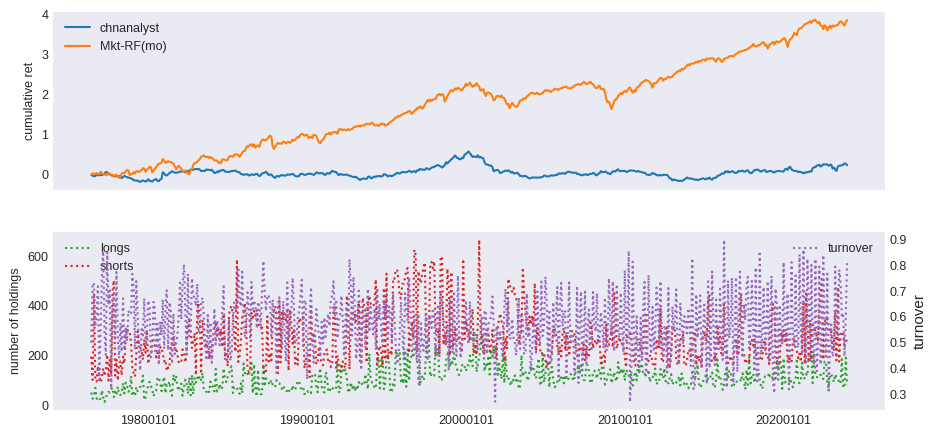

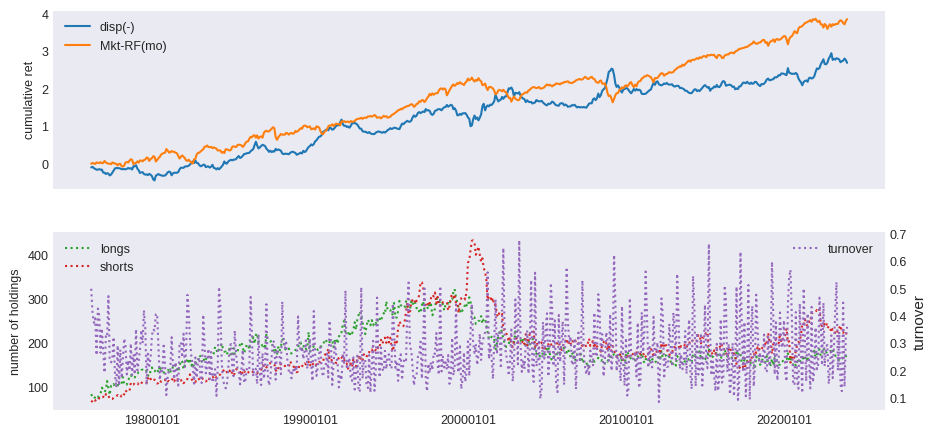

In [161]:
rebalbeg, rebalend = 19760101, LAST_DATE
benchnames = ['Mkt-RF(mo)']
for label in tqdm(columns):
    holdings = univariate_sorts(monthly,
                                label,
                                SignalsFrame(signals.read(label)),
                                rebalbeg,
                                rebalend,
                                window=3,
                                months=[],
                                maxdecile=8,
                                pct=(10., 90.),
                                leverage=leverage.get(label, 1))
    excess = backtest_pipeline(backtest,
                               monthly,
                               holdings,
                               label,
                               benchnames,
                               overlap=0,
                               outdir=outdir,
                               suffix=(leverage.get(label, 1) < 0)*'(-)')

IBES Long-term Growth signals


In [162]:
columns = ['fgr5yr']

In [163]:
df = ibes.get_linked(dataset='statsum',
                     fields = ['meanest'],
                     date_field = 'statpers',
                     where=("meanest IS NOT NULL "
                            "  AND fpi = '0'"
                            "  AND statpers IS NOT NULL"))
out = df.sort_values(['permno', 'statpers', 'meanest'])\
        .drop_duplicates(['permno', 'statpers'])\
        .dropna()
out['rebaldate'] = bd.endmo(out['statpers'])
out['fgr5yr'] = out['meanest']
signals.write(out, 'fgr5yr', overwrite=True)

1311079

100%|██████████| 1/1 [00:46<00:00, 46.86s/it]


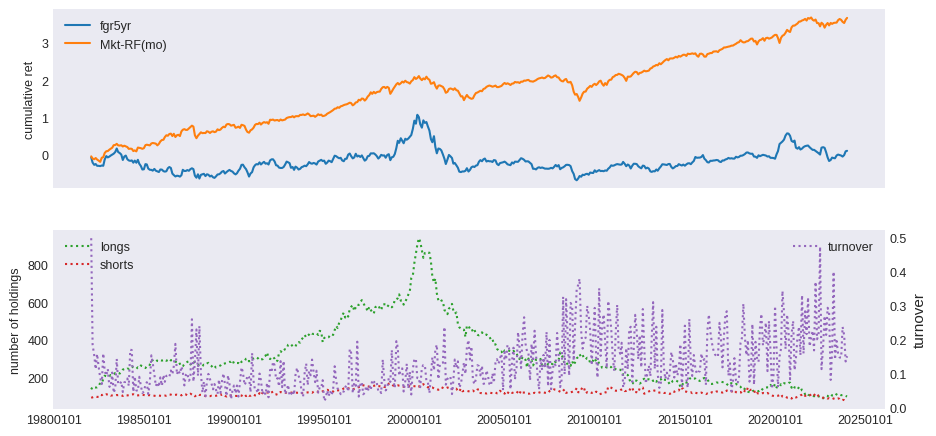

In [164]:
rebalbeg, rebalend = 19760101, LAST_DATE
benchnames = ['Mkt-RF(mo)']
for label in tqdm(columns):
    holdings = univariate_sorts(monthly,
                                label,
                                SignalsFrame(signals.read(label)),
                                rebalbeg,
                                rebalend,
                                window=3,
                                months=[],
                                maxdecile=8,
                                pct=(10., 90.),
                                leverage=leverage.get(label, 1))
    excess = backtest_pipeline(backtest,
                               monthly,
                               holdings,
                               label,
                               benchnames,
                               overlap=0,
                               outdir=outdir,
                               suffix=(leverage.get(label, 1) < 0)*'(-)')

Announcement date in Quarterly, linked to CRSP daily


In [ ]:
columns = ['ear', 'aeavol']

In [51]:
# retrieve rdq, and set rebalance date to at least one month delay
df = pstat.get_linked(dataset='quarterly',
                      fields=['rdq'],
                      date_field='datadate',
                      where=('rdq > 0'))
fund = df.sort_values(['permno', 'rdq', 'datadate'])\
         .drop_duplicates(['permno', 'rdq'])\
         .dropna()
fund['rebaldate'] = bd.offset(fund['rdq'], 2)

In [52]:
# ear is compounded return around 3-day window
out = crsp.get_window(dataset='daily',
                      field='ret',
                      date_field='date',
                      permnos=fund['permno'],
                      dates=fund['rdq'],
                      left=-1,
                      right=1)
fund['ear'] = (1 + out).prod(axis = 1).values

In [53]:
# aeavol is avg volume in 3-day window over 20-day average ten-days prior
actual = crsp.get_window(dataset='daily',
                         field='vol',
                         date_field='date',
                         permnos=fund['permno'],
                         dates=fund['rdq'],
                         left=-1,
                         right=1)
normal = crsp.get_window(dataset='daily',
                         field='vol',
                         date_field='date',
                         permnos=fund['permno'],
                         dates=fund['rdq'],
                         left=-30,
                         right=-11,
                         avg=True)
fund['aeavol'] = normal['vol'].values

In [54]:
signals.write(fund, 'ear', overwrite=True)
signals.write(fund, 'aeavol', overwrite=True)

949558

 50%|█████     | 1/2 [02:36<02:36, 156.72s/it]

     excess  sharpe  alpha  appraisal  welch-t  welch-p  turnover    longs  shorts  buys  sells
ear   0.019   0.167 -0.004     -0.038    0.866    0.387     2.098  249.304  176.47  2.09  2.107


100%|██████████| 2/2 [05:49<00:00, 174.92s/it]

           excess  sharpe  alpha  appraisal  welch-t  welch-p  turnover    longs   shorts   buys  sells
aeavol(-)   0.026   0.235   0.04       0.38   -0.876    0.381     1.943  222.169  145.864  1.935  1.951


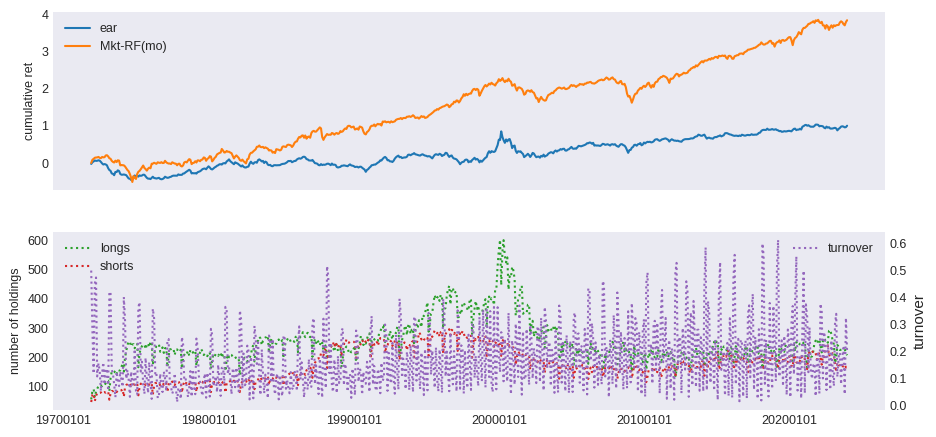

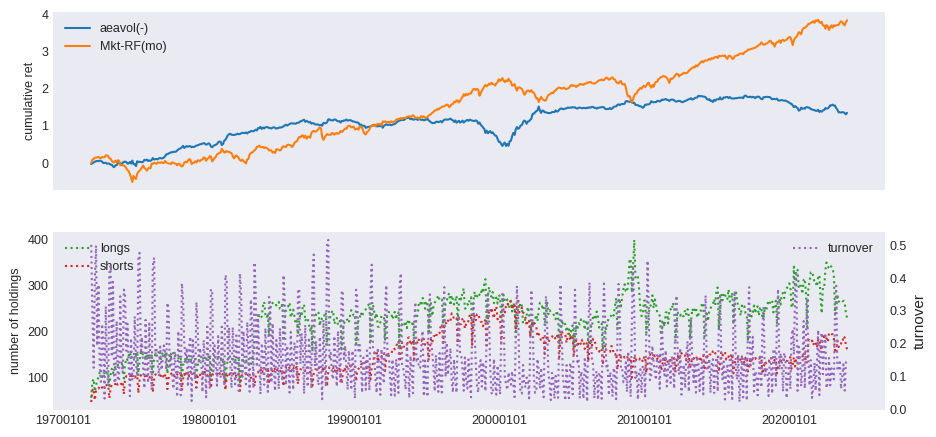

In [55]:
rebalbeg, rebalend = 19700101, LAST_DATE
benchnames = ['Mkt-RF(mo)']
for label in tqdm(columns):
    holdings = univariate_sorts(monthly,
                                label,
                                SignalsFrame(signals.read(label)),
                                rebalbeg,
                                rebalend,
                                window=3,
                                months=[],
                                maxdecile=8,
                                pct=(10., 90.),
                                leverage=leverage.get(label, 1))
    excess = backtest_pipeline(backtest,
                               monthly,
                               holdings,
                               label,
                               benchnames,
                               overlap=0,
                               outdir=outdir,
                               suffix=(leverage.get(label, 1) < 0)*'(-)')

IBES Fiscal Year 1 linked to Quarterly PSTAT


In [ ]:
beg, end = 19760101, LAST_DATE
monthnum = lambda d: ((d//10000)-1900)*12 + ((d//100)%100) - 1

In [57]:
df = pstat.get_linked(dataset='quarterly',
                      fields=['prccq'],
                      date_field='datadate')
df = df.dropna()\
       .sort_values(['permno', 'datadate'])\
       .drop_duplicates(['permno', 'datadate'])

In [58]:
out = ibes.get_linked(dataset='statsum',
                      fields=['fpedats', 'meanest'],
                      date_field='statpers',
                      where="fpi='1'")
out = out.dropna()\
         .sort_values(['permno', 'statpers', 'fpedats'])\
         .drop_duplicates(['permno', 'statpers'])
out['monthnum'] = monthnum(out['statpers'])
out = out.set_index(['permno', 'monthnum'], drop=False)
out['sfeq'] = np.nan

In [59]:
for num in range(4): # match ibes statpers to any datadate in last 4 mos
    df['monthnum'] = monthnum(df['datadate']) - num
    df = df.set_index(['permno', 'monthnum'], drop=False)
    out = out.join(df[['prccq']], how='left')
    out['sfeq'] = out['sfeq'].where(out['sfeq'].notna(),
                                    out['meanest'] / out['prccq'].abs())
    out = out.drop(columns=['prccq'])

    out['rebaldate'] = bd.endmo(out['statpers'])
    n = signals.write(out.reset_index(drop=True), 'sfeq', overwrite=True)

IBES Fiscal Year 1 linked to IBES price history


In [ ]:
beg, end = 19760101, LAST_DATE

In [61]:
# retrieve monthly price history
df = ibes.get_linked(dataset='actpsum',
                     fields=['price'],
                     date_field='statpers')
hist = df.dropna()\
         .sort_values(['permno', 'statpers'])\
         .drop_duplicates(['permno', 'statpers'], keep='last')\
         .set_index(['permno', 'statpers'])

In [62]:
# retrieve monthly FY1 mean estimate
df = ibes.get_linked(dataset='statsum',
                     fields=['fpedats', 'meanest'],
                     date_field='statpers',
                     where="fpi='1' AND statpers <= fpedats")
out = df.dropna()\
        .sort_values(['permno', 'statpers', 'fpedats'])\
        .drop_duplicates(['permno', 'statpers'])\
        .set_index(['permno', 'statpers'])

In [63]:
# join on [permno, statpers], and reindex on [permno, rebaldate]
out = out.join(hist[['price']], how='left').reset_index()
out['rebaldate'] = bd.endmo(out['statpers'])
out = out.set_index(['permno', 'rebaldate'])
out['sfe'] = out['meanest'].div(out['price'].abs())
n = signals.write(out.reset_index(), 'sfe', overwrite=True)

     excess  sharpe  alpha  appraisal  welch-t  welch-p  turnover    longs   shorts  buys  sells
sfe   0.052   0.285  0.081      0.462   -0.034    0.973     2.126  148.671  297.957  2.12  2.132


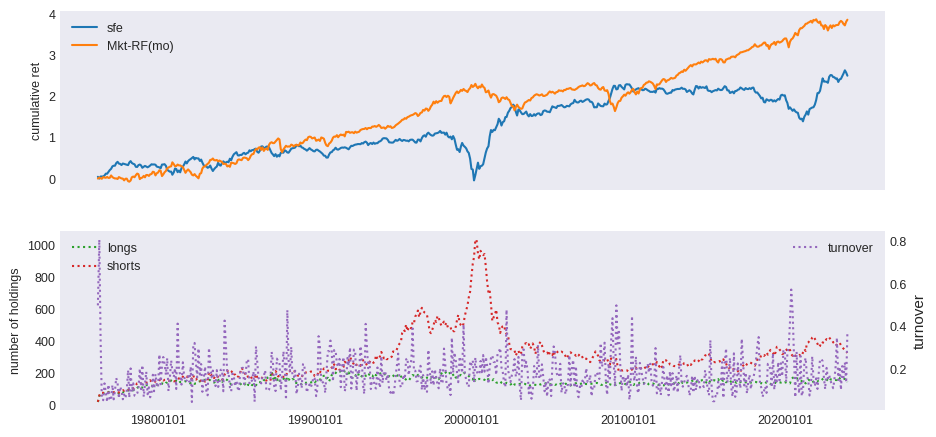

In [64]:
rebalbeg, rebalend = 19760101, LAST_DATE
benchnames = ['Mkt-RF(mo)']
label = 'sfe'
holdings = univariate_sorts(monthly,
                            label,
                            SignalsFrame(signals.read(label)),
                            rebalbeg,
                            rebalend,
                            window=3,
                            months=[],
                            maxdecile=8,
                            pct=(10., 90.),
                            leverage=leverage.get(label, 1))
excess = backtest_pipeline(backtest,
                           monthly,
                           holdings,
                           label,
                           benchnames,
                           overlap=0,
                           outdir=outdir, 
                           suffix=(leverage.get(label, 1) < 0)*'(-)')

IBES Fiscal Quarter 1, linked to Quarterly


In [ ]:
columns = ['sue']
numlag = 4
end = LAST_DATE

In [66]:
# retrieve quarterly, keep [permno, datadate] key with non null prccq
df = pstat.get_linked(dataset='quarterly',
                      fields=['prccq', 'cshoq', 'ibq'],
                      date_field='datadate',
                      where=f"datadate <= {end//100}31")
fund = df.dropna(subset=['ibq'])\
         .sort_values(['permno', 'datadate', 'cshoq'])\
         .drop_duplicates(['permno', 'datadate'])
fund['rebaldate'] = bd.endmo(fund['datadate'], numlag)
fund = fund.set_index(['permno', 'rebaldate'], drop=False)

In [67]:
# retrieve ibes Q1 where forecast period <= fiscal date, keep latest
df = ibes.get_linked(dataset='statsum',
                     fields=['fpedats', 'medest', 'actual'],
                     date_field='statpers',
                     where=" fpi = '6' AND statpers <= fpedats")
summ = df.dropna()\
         .sort_values(['permno', 'fpedats', 'statpers'])\
         .drop_duplicates(['permno', 'fpedats'], keep='last')
summ['rebaldate'] = bd.endmo(summ['fpedats'], numlag)
summ = summ.set_index(['permno', 'statpers'])

In [68]:
# retrieve ibes price, then left join
df = ibes.get_linked(dataset='actpsum',
                     fields=['price'],
                     date_field='statpers')
hist = df.dropna()\
         .sort_values(['permno', 'statpers'])\
         .drop_duplicates(['permno', 'statpers'], keep='last')
hist = hist.set_index(['permno', 'statpers'])
summ = summ.join(hist[['price']], how='left')
summ = summ.reset_index()\
           .set_index(['permno', 'rebaldate'])\
           .reindex(fund.index)

In [69]:
# sue with ibes surprise and price
fund['sue'] = (summ['actual'] - summ['medest']) / summ['price'].abs()

In [70]:
# sue with ibes surprice and compustat quarterly price
fund['sue'] = fund['sue'].where(
    fund['sue'].notna(), (summ['actual'] - summ['medest']) / fund['prccq'].abs())

In [71]:
# sue with lag(4) difference in compustat quarterly and price
lag = fund.shift(4, fill_value=0)
fund['sue'] = fund['sue'].where(
    fund['sue'].notna() | (lag['permno'] != fund['permno']),
    ((fund['ibq'] - lag['ibq']) / (fund['prccq'] * fund['cshoq']).abs()))

In [72]:
signals.write(fund.reset_index(drop=True), 'sue', overwrite=True)

1069502

100%|██████████| 1/1 [04:15<00:00, 255.90s/it]

     excess  sharpe  alpha  appraisal  welch-t  welch-p  turnover   longs   shorts   buys  sells
sue   0.053   0.479  0.057      0.518    0.512    0.609     3.436  183.05  177.005  3.422  3.449


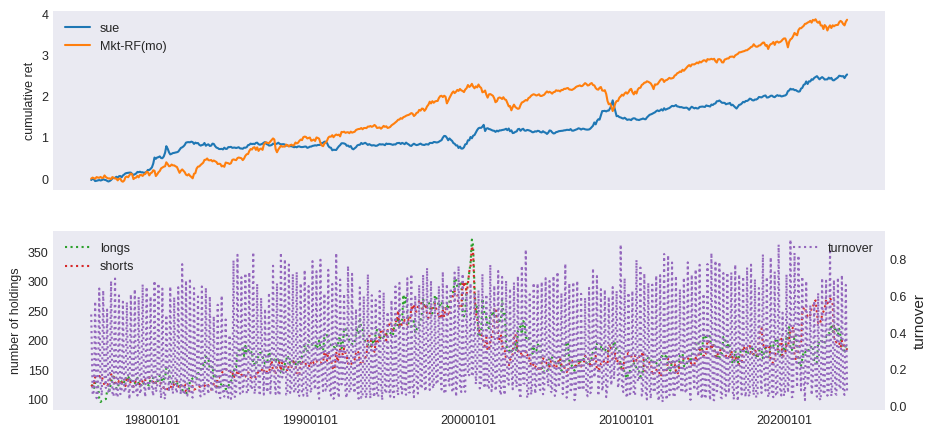

In [75]:
rebalbeg, rebalend = 19760101, LAST_DATE
benchnames = ['Mkt-RF(mo)']
for label in tqdm(columns):
    holdings = univariate_sorts(monthly,
                                label,
                                SignalsFrame(signals.read(label)),
                                rebalbeg,
                                rebalend,
                                window=3,
                                months=[],
                                maxdecile=8,
                                pct=(10., 90.),
                                leverage=leverage.get(label, 1))
    excess = backtest_pipeline(backtest,
                               monthly,
                               holdings,
                               label,
                               benchnames,
                               overlap=0,
                               outdir=outdir,
                               suffix=(leverage.get(label, 1) < 0)*'(-)')

### Backtests

The backtests are all of univariate dollar-neutral spreads between the top and bottom deciles of the characteristic. Stocks are value-weighted within each decile, and exclude firms in the smallest quintile of NYSE market capitalization. Spread portfolios are rebalanced monthly, with fundamental data lagged in the usual manner (six months for annual, 4 months for quarterly). In addition to the time series of cumulative spread portfolio and market index returns, the monthly turnover rate and number of long and short positions are also graphed.

The summary of backtest results is sorted by Welch's t-value testing for difference in pre-2002 and post-2003 mean returns, as Green et al (2017) and others have also found a sharp drop in return predictability of many these factors then. 

The __maximum drawdown__ is also computed for each strategy -- this is defined as the maximum loss from a peak to a trough of the cumulative returns of a strategy, before a new peak is attained. It is a historical measure of a worse case analysis.

In [76]:
def maximum_drawdown(x: Series, is_price_level: bool = False) -> Series:
    """Compute max drawdown (max loss from previous high) period and returns"""
    cumsum = np.log(1 + x).cumsum()
    cummax = cumsum.cummax()
    end = (cummax - cumsum).idxmax()
    beg = cumsum[cumsum.index <= end].idxmax()
    dd = cumsum.loc[[beg, end]]
    return np.exp(dd)

In [77]:
zoo = backtest.read().sort_values(['begret', 'permno'])
r = []
rets = []
for label in zoo.index:
    perf = backtest.read(label)
    rets.append(perf['ret'].rename(label))
    excess = {'ret': backtest.fit(['Mkt-RF(mo)'])}
    excess['annualized'] = backtest.annualized
    excess['dd'] = maximum_drawdown(backtest.perf['excess'])
    post = {'ret': backtest.fit(['Mkt-RF(mo)'],
                                beg=20020101).copy()}
    post['annualized'] = backtest.annualized.copy()
    s = label + ('(-)' if leverage.get(label, 1) < 0 else '')
    r.append(DataFrame({
        #            'Start': excess['ret'].index[0],
        'Sharpe Ratio': excess['annualized']['sharpe'],
        'Alpha': excess['annualized']['alpha'],
        'Appraisal Ratio': excess['annualized']['appraisal'],
        'Avg Ret': excess['ret']['excess'].mean(),
        'Vol': excess['ret']['excess'].std(ddof=0),
        'Welch-t': excess['annualized']['welch-t'],
        'Appraisal2002': post['annualized']['appraisal'],
        'Ret2002': post['ret']['excess'].mean(),
        'Drawdown': (excess['dd'].iloc[1]/excess['dd'].iloc[0]) - 1,
    }, index=[s]))
df = pd.concat(r, axis=0).round(4).sort_values('Welch-t')


,Sharpe Ratio,Alpha,Appraisal Ratio,Avg Ret,Vol,Welch-t,Appraisal2002,Ret2002,Drawdown
chcsho(-),0.6159,0.0786,0.8231,0.0052,0.0294,-0.9003,0.7323,0.0040,-0.2720
sue,0.4788,0.0570,0.5179,0.0044,0.0318,0.5115,0.7110,0.0051,-0.3999
mom12m,0.4557,0.1493,0.6395,0.0098,0.0732,-1.4424,0.4489,0.0043,-0.9670
chfeps,0.4380,0.0619,0.5166,0.0044,0.0350,-0.7879,0.5138,0.0032,-0.3299
mom1m(-),0.4002,0.0597,0.3306,0.0064,0.0541,-2.4864,-0.2796,-0.0009,-0.7172
...,...,...,...,...,...,...,...,...,...
pchquick,-0.1594,-0.0149,-0.1689,-0.0012,0.0254,-0.0714,-0.2631,-0.0013,-0.7598
cfp_ia,-0.1921,-0.0353,-0.2600,-0.0022,0.0396,-0.3738,-0.4263,-0.0029,-0.8612
pchcapx_ia,-0.2251,-0.0287,-0.2356,-0.0023,0.0352,0.1500,-0.1287,-0.0020,-0.8845
grcapx,-0.2910,-0.0412,-0.4101,-0.0025,0.0299,1.5998,-0.1046,-0.0002,-0.8722


In [81]:
pd.set_option("display.max_colwidth", None, 'display.max_rows', None)
df #.sort_values('Sharpe Ratio', ascending=False)

,Sharpe Ratio,Alpha,Appraisal Ratio,Avg Ret,Vol,Welch-t,Appraisal2002,Ret2002,Drawdown
chcsho(-),0.6159,0.0786,0.8231,0.0052,0.0294,-0.9003,0.7323,0.0040,-0.2720
sue,0.4788,0.0570,0.5179,0.0044,0.0318,0.5115,0.7110,0.0051,-0.3999
mom12m,0.4557,0.1493,0.6395,0.0098,0.0732,-1.4424,0.4489,0.0043,-0.9670
chfeps,0.4380,0.0619,0.5166,0.0044,0.0350,-0.7879,0.5138,0.0032,-0.3299
mom1m(-),0.4002,0.0597,0.3306,0.0064,0.0541,-2.4864,-0.2796,-0.0009,-0.7172
chmom,0.3990,0.0504,0.3097,0.0058,0.0492,-2.0332,-0.0982,0.0006,-0.6133
egr(-),0.3805,0.0599,0.5707,0.0035,0.0322,-0.6843,0.4828,0.0026,-0.3384
chinv(-),0.3699,0.0513,0.4865,0.0033,0.0313,-0.6077,0.3094,0.0024,-0.2747
indmom,0.3590,0.0657,0.3781,0.0054,0.0513,-1.2340,0.2213,0.0023,-0.6892
acc(-),0.3479,0.0386,0.3612,0.0031,0.0309,-1.2949,0.0954,0.0012,-0.3966


In [82]:
X = pd.concat(rets, join='outer', axis=1).dropna()
X = X/X.std()   # standardize to unit variance
corr = X.corr()
dist = np.sqrt(1 - corr)

## Cluster analysis

The historical backtests of portfolio returns are considered as the features for cluster analysis, which can be used to identify and construct peer benchmarks for each strategy. Strategies whose returns move up or down together tend to load on similar "style" factors, and should be evaluated against each other. 

The correlation between two series of returns is closely related to the Euclidean distance between the series.  When the returns are standardized to have unit variance, the two metrics can be derived exactly from each other. Recall that the squared Euclidean norm between two standardized series $x$ and $y$ is:

$d^2 = \sum_i (x_i -y_i)^2 = \sum_i x_i^2 + \sum_i y_i^2 - 2 \sum_i x_i y_i = n + n + 2 n \rho$ 

since $\sum_i x_i^2 = \sum_i y_i^2 = n$, and $\rho = \sum_i x_i y_i / n$. 

Hence correlation $\rho = 1 - \dfrac{d^2}{2n}$


### Hiearchical clustering

This builds a hierarchy of clusters by iteratively merging clusters based on their linkage similarity. Linkage methods determine how the distance between clusters is measured and how clusters are merged. Linkage methods include:

- Single Linkage: Measures the distance between the closest points of two clusters and merges the clusters with the smallest distance. It tends to produce elongated clusters.

- Complete Linkage: Measures the distance between the farthest points of two clusters and merges the clusters with the smallest maximum distance. It tends to produce compact, spherical clusters.

- Average Linkage: Measures the average distance between all pairs of points in two clusters and merges the clusters with the smallest average distance. It balances between single and complete linkage, often producing balanced clusters.

- Ward's Method: Minimizes the within-cluster variance when merging clusters. It tends to produce clusters with similar sizes and shapes.


In [83]:
model = AgglomerativeClustering(metric='precomputed', linkage='average',
                                distance_threshold=0, n_clusters=None).fit(dist)

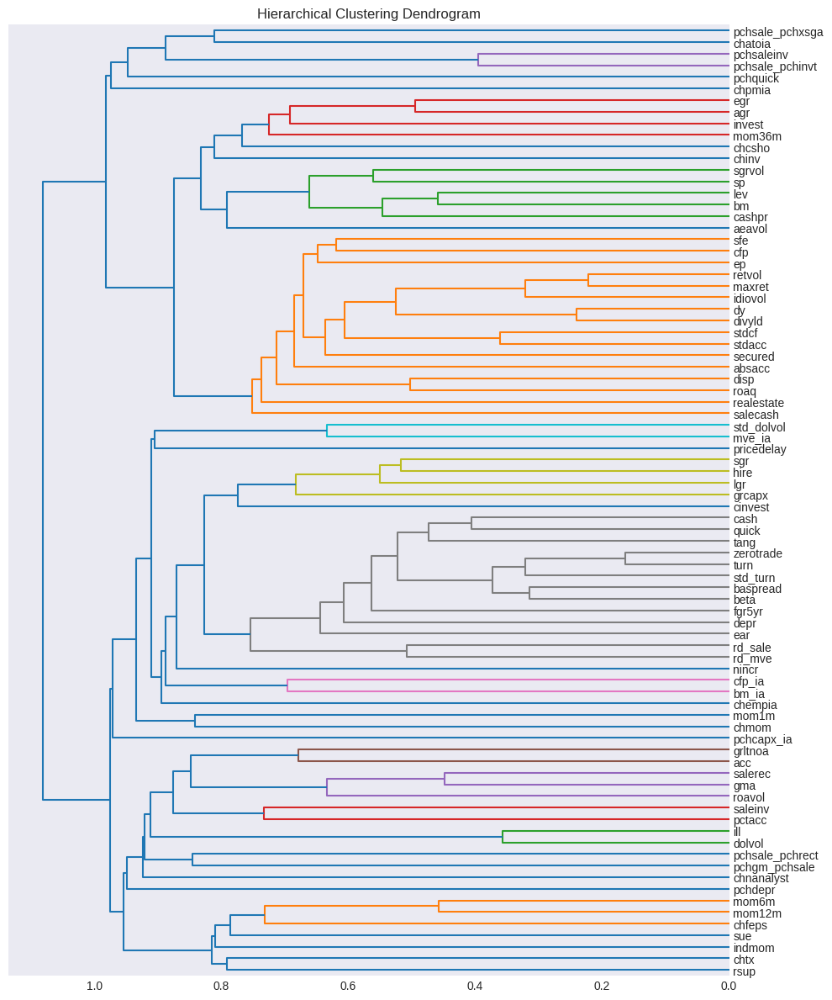

In [92]:
fig, ax = plt.subplots(figsize=(10, 12))
plt.title("Hierarchical Clustering Dendrogram")
# Create linkage matrix and then plot the dendrogram
# scikit-learn: "Plot Hierarchical Clustering Dendrogram"
counts = np.zeros(model.children_.shape[0])
n_samples = len(model.labels_)
# create the counts of samples under each node
for i, merge in enumerate(model.children_):
    current_count = 0
    for child_idx in merge:
        if child_idx < n_samples:
            current_count += 1  # leaf node
        else:
            current_count += counts[child_idx - n_samples]
    counts[i] = current_count

linkage_matrix = np.column_stack([model.children_, model.distances_, counts])\
                   .astype(float)
# Plot the corresponding dendrogram
dendrogram(linkage_matrix, orientation='left', labels=dist.columns, leaf_font_size=10)
plt.tight_layout()

### K-means clustering

K-means clustering is a popular unsupervised machine learning algorithm used for partitioning a dataset into K distinct, non-overlapping clusters. It starts by specifying the number of clusters, and choosing K initial cluster centroids randomly. Then it iteratively assigns data points to the nearest centroid, recalculating the centroids based on the means of data points in each new cluster, and repeating until convergence. K-means clustering aims to minimize the within-cluster sum of squared distances, making it suitable for datasets where clusters are spherical and have similar sizes. 

The elbow method is a graphical method for selecting the "best" number of clusters in a k-means clustering algorithm. The graph shows the within-cluster sum-of-square values corresponding to the different values of K. The optimal K value is the point at which the graph forms an elbow.


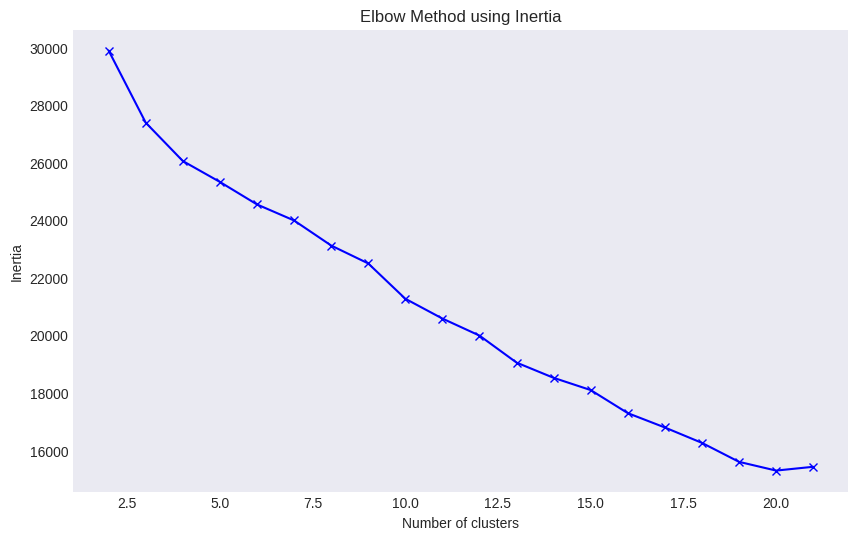

In [98]:
# Selecting number of centers with elbow method
inertias = []
n_clusters = list(range(2, 22))
for n_cluster in n_clusters:
    kmeans = KMeans(n_clusters=n_cluster, random_state=0, n_init="auto").fit(X.T)
    inertias.append(kmeans.inertia_)
plt.figure(figsize=(10, 6))
plt.plot(n_clusters, inertias, 'bx-')
plt.xlabel('Number of clusters')
plt.ylabel('Inertia')
plt.title('Elbow Method using Inertia')
plt.show()

__Silhouette analysis__ can also be used to evaluate the appropriateness of the number of clusters in K-means clustering. The silhouette score measures how similar a data point is to its own cluster compared to other clusters. It is the difference between cohesion subscore (i.e. the average distance between the data point and all other points within the same cluster) and separation subscore (the average distance between the data point and all points in each neighboring cluster). It is scaled by the maximum of those two subscores, hence ranges from -1 to 1, with higher values indicating better cluster separation. The number of clusters that maximizes the average silhouette score across all data points is chosen, which provides the best balance between cohesion within clusters and separation between clusters.

For n_clusters = 2 The average silhouette_score is : 0.12501306263608986
For n_clusters = 3 The average silhouette_score is : 0.1253520808683055
For n_clusters = 4 The average silhouette_score is : 0.051754214259910544
For n_clusters = 5 The average silhouette_score is : 0.05274630449356275
For n_clusters = 6 The average silhouette_score is : 0.04667415065092019
For n_clusters = 7 The average silhouette_score is : 0.060547187594243324
For n_clusters = 8 The average silhouette_score is : 0.006033319118781096
For n_clusters = 9 The average silhouette_score is : 0.018578386636466958
For n_clusters = 10 The average silhouette_score is : 0.005929767389313637
For n_clusters = 11 The average silhouette_score is : 0.0016142827400304784
For n_clusters = 12 The average silhouette_score is : 0.009433277087319107
For n_clusters = 13 The average silhouette_score is : 0.0074058888550970915
For n_clusters = 14 The average silhouette_score is : 0.008390097852726994
For n_clusters = 15 The average silh

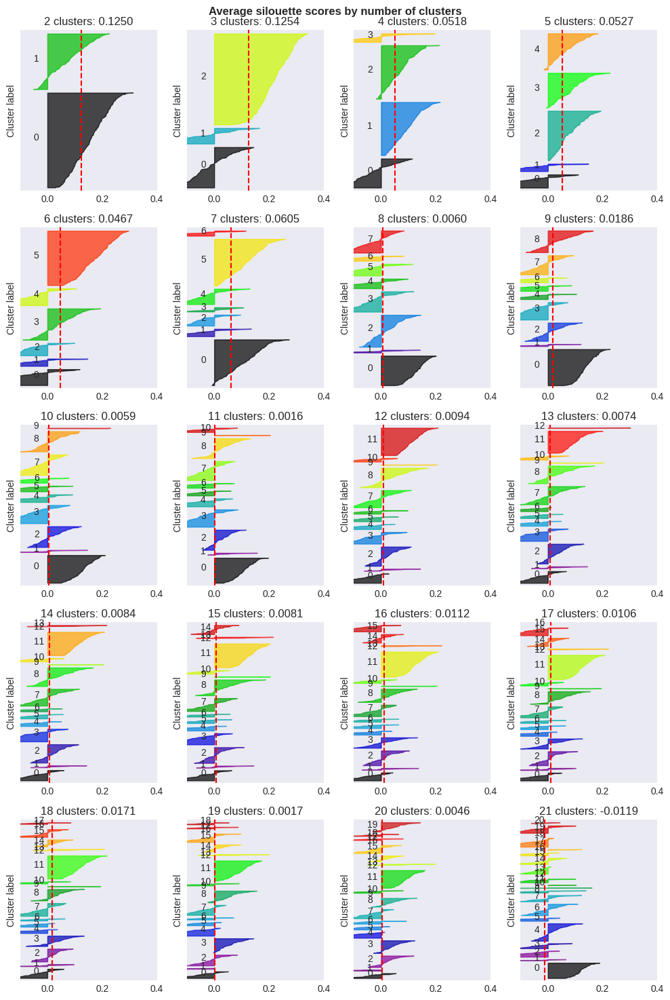

In [99]:
# scikit-learn: "Selecting the number of clusters with silhouette analysis 
# on KMeans clustering"
fig, ax = plt.subplots(ncols=4, nrows=int(np.round(len(n_clusters)/4)), figsize=(10, 15))
ax = ax.flatten()
for n_cluster, ax1 in zip(n_clusters, ax):
    clusterer = KMeans(n_clusters=n_cluster, n_init='auto', random_state=10)
    cluster_labels = clusterer.fit_predict(X)

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters
    silhouette_avg = silhouette_score(X, cluster_labels)
    print("For n_clusters =", n_cluster,
          "The average silhouette_score is :", silhouette_avg)
    
    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(X, cluster_labels)

    ax1.set_title(f"{n_cluster} clusters: {silhouette_avg:.4f}")    
    ax1.set_xlim([-0.1, .4])
    ax1.set_ylim([0, len(X) + (n_cluster + 1) * 10])

    y_lower = 10
    for i in range(n_cluster):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_cluster)
        ax1.fill_betweenx(
            np.arange(y_lower, y_upper),
            0,
            ith_cluster_silhouette_values,
            facecolor=color,
            edgecolor=color,
            alpha=0.7,
        )

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples
    ax1.set_ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
#    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])
    plt.suptitle("Average silouette scores by number of clusters", fontweight="bold")
    plt.tight_layout()
plt.show()

Heatmap of correlations of strategy returns, grouped together in clusters identified by the K-Means algorithm with K=20. 

In [ ]:
kmeans = KMeans(n_clusters=20, random_state=0, n_init="auto").fit(X.T)
Z = DataFrame(kmeans.transform(X.T), index=X.columns)
Z['distance'] = np.min(Z.iloc[:, :kmeans.n_clusters], axis=1)
Z['cluster'] = np.argmin(Z.iloc[:, :kmeans.n_clusters], axis=1)
Z = Z.sort_values(['cluster', 'distance'])  # group by cluster and distance to center

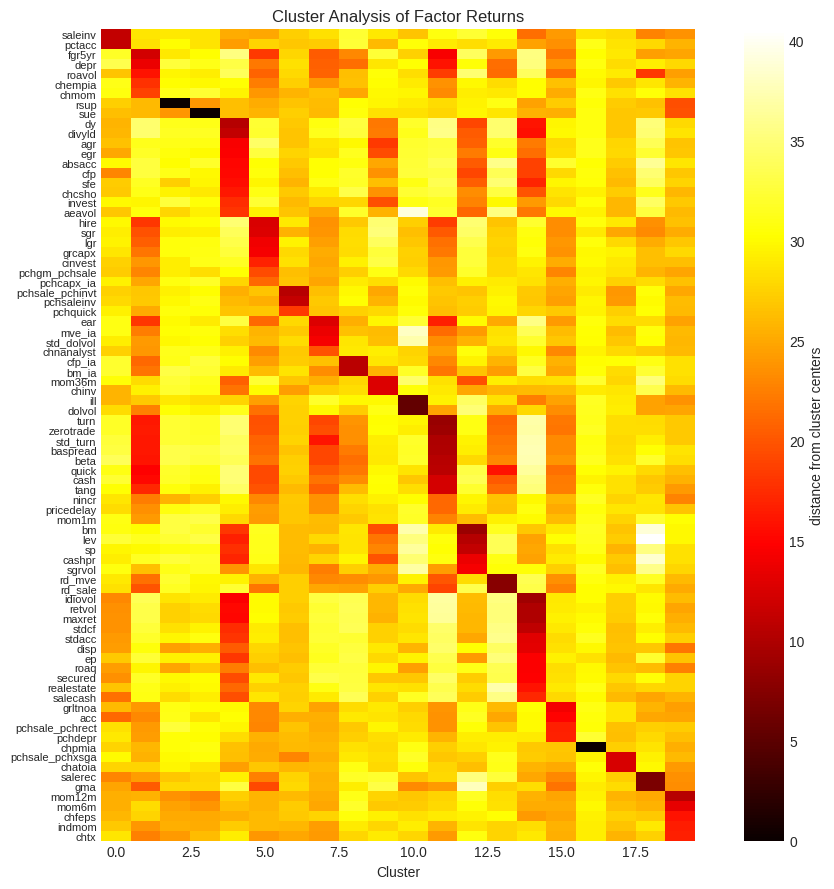

In [105]:
fig, ax = plt.subplots(figsize=(10, 9))
plt.title('Cluster Analysis of Factor Returns')
plt.imshow(Z.iloc[:, :kmeans.n_clusters], cmap='hot', aspect=1/3)
plt.yticks(range(len(Z)), labels=Z.index, fontsize=8)
plt.xlabel('Cluster')
plt.colorbar(label='distance from cluster centers')
plt.tight_layout()
plt.show()